# Flux calibration of G7.7-3.7 dataset
### In this Jupyter notebook:
- Matching PanStarrs star catalogue with positions of stars detected in my images
- Filtering catalogue to use only reliable stars (magnitude range, match distance range, badly fitted temperatures, NaN values exclusion..)
- Interpolating star temperatures and from that flux in the narrow-band filters  
- Fitting zero point correction values for the images (using sigma clipping)
- Correcting images and subtracting background

In [1]:
from astropy.io import fits
import numpy as np
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy import constants as c
from astropy import wcs
import astropy.coordinates as coord
import aplpy
import matplotlib.pyplot as plt
from astropy.coordinates import ICRS,FK4
from astropy.stats import sigma_clip
import lmfit
from lmfit import Model
from lmfit import minimize, Parameters
from scipy.ndimage import gaussian_filter
import platform
import pandas as pd
from astropy.visualization import (MinMaxInterval, ZScaleInterval, SqrtStretch, ImageNormalize)
from matplotlib import cm
import time

In [2]:
from astropy.nddata.utils import Cutout2D
from reproject import reproject_exact, reproject_interp, reproject_adaptive
import astropy

In [3]:
if platform.uname().node == 'artemis':
    folder = '/home/vdomcek/Dropbox/academia/projects/2019_INT_La_Palma/g7/analysis/'
if platform.uname().node == 'prometheus':
    folder = '/Users/vdomcek/Dropbox/academia/projects/2019_INT_La_Palma/g7/analysis/'
if platform.uname().node == 'Eos':
    folder = 'C:\\Users\\Vladimir\\Dropbox/work/2019_INT_La_Palma/g7/analysis/'
print(f"Node Name: {platform.uname().node}")
print(f'Path:', folder)

Node Name: artemis
Path: /home/vdomcek/Dropbox/academia/projects/2019_INT_La_Palma/g7/analysis/


# Used functions

In [4]:
def fun_cutout(infile, outfile, centre_coordinates, shape):
    """
    Creates a smaller cutout region for the flux calibration
    """
    hdu = fits.open(infile)
    w = wcs.WCS(hdu[0].header)
    position = w.world_to_pixel(centre_coordinates)
    
    cutout = Cutout2D(hdu[0].data, position, shape, wcs=w)
    
    fig = plt.figure(figsize=(8,8),dpi=120)
    ax = plt.subplot(111)#, projection=cutout.wcs)
    ax.imshow((cutout.data), origin='lower', cmap='Greys', norm=ImageNormalize(cutout.data, ZScaleInterval()))
    plt.title(outfile.split('/')[-1])
    plt.show()
    plt.close()
    
    w = cutout.wcs
    w.to_header()
    
    new_header = hdu[0].header[:6] + w.to_header() + hdu[0].header[22:]
    new_header['history'] = '--------------------------------------------------'
    new_header['history'] = 'Used script:    int_flux_calibration.ipynb'
    new_header['history'] = 'Author:         Vladimir Domcek'
    new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
    new_header['history'] = 'Main changes: '
    new_header['history'] = 'Cutout of the shock region'

    new_file_hdu = fits.PrimaryHDU()
    new_file_hdu.header = new_header
    new_file_hdu.data = cutout.data
    new_file_hdu.verify('fix')
    new_file_hdu.writeto(outfile, overwrite=True)
    hdu.close()

In [5]:
def fun_get_INT_coo(infile, image_data):
    """
    Opening the header to retrieve the WCS solution 
    and applying to the X_IMAGE and Y_IMAGE From Sextractor catalogue file
    """
    hdulist = fits.open(infile[:-4])
    w = wcs.WCS(hdulist[0].header)
    hdulist.close()
    xyz = np.array([image_data['X_IMAGE'],image_data['Y_IMAGE']])

    w.wcs_pix2world(xyz.T,1).T[0]
    w.wcs_pix2world(xyz.T,1).T[1]

    coo_filter = SkyCoord(w.wcs_pix2world(xyz.T,1).T[0]*u.deg, w.wcs_pix2world(xyz.T,1).T[1]*u.deg, frame=ICRS)
    return coo_filter

In [6]:
def linear_res(linear_pars, x, data=None, eps=None):
    """
    Linear model setup
    """
    # unpack parameters:
    # extract .value attribute for each parameter
    parvals = linear_pars.valuesdict()
    zp = parvals['zp']

    model = x+parvals['zp']

    if data is None:
        return model
    if eps is None:
        return (model - data)
    return (model - data)/eps

def linear_mo(x, zp):
    return x+zp

lin_model = lmfit.Model(linear_mo)

linear_pars = Parameters()
linear_pars.add('zp',value = -18)

In [7]:
def fun_fit_zp(args):
    """
    Fitting routine with the sigma clipping
    """
    out = minimize(linear_res, linear_pars, args=args)
    zp = out.params['zp'].value
    ave = args[0] - args[1] +zp
    ff_ave  = ~(sigma_clip(ave).mask)
    out = minimize(linear_res, linear_pars, args=(args[0][ff_ave], args[1][ff_ave], args[2][ff_ave]))
    zp = out.params['zp'].value
    return zp, out, ff_ave

In [8]:
def fun_calc_magnitude_z(dataset, flags,z,extinct_factor):
    """
    Calculate magnitude from the SExtractor catalogue flux value
    Background is added as otherwise it would be double subtracted
    """
    star_flux = (dataset[flags]['FLUX_AUTO'] + dataset[flags]['FLUX_RADIUS']**2 * dataset[flags]['BACKGROUND'])
    mag = -2.5*np.log10(star_flux) + (z-1)*extinct_factor
    mag_err = abs(1.0857 * dataset[flags]['FLUXERR_AUTO']) / star_flux  
    return mag, mag_err

In [9]:
def fun_calc_magnitude_z_test(dataset, flags,z,extinct_factor):
    """
    Calculate magnitude from the SExtractor catalogue flux value
    Background is added as otherwise it would be double subtracted
    """
    star_flux = dataset[flags]['FLUX_AUTO'] 
    mag = -2.5*np.log10(star_flux) + (z-1)*extinct_factor
    mag_err = abs(1.0857 * dataset[flags]['FLUXERR_AUTO']) / star_flux  
    return mag, mag_err

In [10]:
def fun_pogson_erg_to_mag_z(Flux,a1,z, extinct_factor): 
    """
    Convert flux to magnitude, including airmass extinction
    48.6 relates to Jansky
    """
    return -2.5*np.log10(Flux*10**a1) - 48.6 - (z-1)*extinct_factor

In [11]:
params_color_plot = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'xx-large',
          'ytick.labelsize': 'xx-large',
         }

# Grid of stellar atmosphere models of kurucz. 
#### In this jupyter lab notebook we use the grid to estimate the temperature of the stars detected in panstars catalogue, and estimate the flux that should be observed by the narrowband filter on INT.

In [12]:
kurucz = pd.read_csv(folder + 'vlad_grid.csv')

def star_interp_panstars(temp):
    dist  = np.abs(temp - kurucz['temp'].values)
   
    idx = np.argpartition(dist, 2)
    temps = [kurucz['temp'].values[idx[0]],kurucz['temp'].values[idx[1]]]
    f1 = np.abs((temp - temps[1])/(temps[0] -temps[1]))
    f2 = np.abs((temp - temps[0])/(temps[0] -temps[1]))

    #### Change the filters that want to be interpolated!!!!
    interpo = f2 * kurucz[['g_pan','r_pan','i_pan','z_pan','y_pan']].values[idx[1]] + \
              f1 * kurucz[['g_pan','r_pan','i_pan','z_pan','y_pan']].values[idx[0]]

    return interpo

def star_interp_INT(temp):
    dist  = np.abs(temp - kurucz['temp'].values)
   
    idx = np.argpartition(dist, 2)
    temps = [kurucz['temp'].values[idx[0]],kurucz['temp'].values[idx[1]]]
    f1 = np.abs((temp - temps[1])/(temps[0] -temps[1]))
    f2 = np.abs((temp - temps[0])/(temps[0] -temps[1]))

    #### Change the filters that want to be interpolated!!!!
    interpo = f2 * kurucz[['g_sdss','r_sdss','halpha','hbeta','oiii','sii']].values[idx[1]] + \
              f1 * kurucz[['g_sdss','r_sdss','halpha','hbeta','oiii','sii']].values[idx[0]]

    return interpo

def star_sed(temp):
    dist  = np.abs(temp - kurucz['temp'].values)
   
    idx = np.argpartition(dist, 2)
    temps = [kurucz['temp'].values[idx[0]],kurucz['temp'].values[idx[1]]]
    f1 = np.abs((temp - temps[1])/(temps[0] -temps[1]))
    f2 = np.abs((temp - temps[0])/(temps[0] -temps[1]))

    kurucz_flux1 = np.fromstring(kurucz['flux'].values[idx[1]][1:-1], dtype=np.float, sep=' ')
    kurucz_flux0 = np.fromstring(kurucz['flux'].values[idx[0]][1:-1], dtype=np.float, sep=' ')
    kurucz_wave = np.fromstring(kurucz['wave'].values[idx[0]][1:-1], dtype=np.float, sep=' ')

    interpo = (f2 * kurucz_flux1 + f1 * kurucz_flux0 )* (kurucz_wave**2)/2.998e18*1e-23
    return interpo

def residual(pars, data=None, eps=None):
    """
    Calculating residuals for the fit
    """
    # unpack parameters: extract .value attribute for each parameter
    parvals = pars.valuesdict()
    a1 = parvals['a1']
    tempu = parvals['tempu']
    sed = star_interp_panstars(tempu)
   
    model = 10**parvals['a1']  * sed

    if data is None:
        return model
    if eps is None:
        return model - data
    return (model-data) / eps

def fun_get_temp(row):
    """
    Fit star temperature
    """
    mag = np.array([row['gMeanPSFMag'],row['rMeanPSFMag'],row['iMeanPSFMag'],row['zMeanPSFMag'],row['yMeanPSFMag']])
    mag_err = np.array([row['gMeanPSFMagErr'],row['rMeanPSFMagErr'],row['iMeanPSFMagErr'],row['zMeanPSFMagErr'],row['yMeanPSFMagErr']])
    Flux = 10** ((mag + 48.6)/-2.5)
    Flux_err = (mag_err*Flux)/1.0857   
    out = minimize(residual, fit_params, kws={'data': Flux, 'eps':Flux_err}, nan_policy='omit') # there is one filter that has nan values
    return out.params['tempu'].value, out.params['tempu'].stderr, out.params['a1'].value, out.params['a1'].stderr

def fun_get_temp_r(row):
    """
    Fit star temperature and give reduced chisq output
    """
    mag = np.array([row['gMeanPSFMag'],row['rMeanPSFMag'],row['iMeanPSFMag'],row['zMeanPSFMag'],row['yMeanPSFMag']])
    mag_err = np.array([row['gMeanPSFMagErr'],row['rMeanPSFMagErr'],row['iMeanPSFMagErr'],row['zMeanPSFMagErr'],row['yMeanPSFMagErr']])
    Flux = 10** ((mag + 48.6)/-2.5)
    Flux_err = (mag_err*Flux)/1.0857   
    out = minimize(residual, fit_params, kws={'data': Flux, 'eps':Flux_err}, nan_policy='omit') # there is one filter that has nan values
    return out.params['tempu'].value, out.params['tempu'].stderr, out.params['a1'].value, out.params['a1'].stderr, out.redchi

fit_params = Parameters()
fit_params.add('a1', value=1.5)
fit_params.add('tempu', value=5000.0,min=1500.)

# Load the Panstars catalogue

In [13]:
panstars = pd.read_csv(folder+'panstars_dr2_g7_south_shocks_region.csv')

In [14]:
panstars.head()

,Unnamed: 0,objID,raMean,decMean,nDetections,ng,nr,ni,nz,ny,gMeanPSFMag,gMeanPSFMagErr,rMeanPSFMag,rMeanPSFMagErr,iMeanPSFMag,iMeanPSFMagErr,zMeanPSFMag,zMeanPSFMagErr,yMeanPSFMag,yMeanPSFMagErr
0,0,78862742915449615,274.291559,-24.275585,75,9,8,15,20,23,17.320900,0.020370,15.970900,0.009444,15.264500,0.020699,14.703400,0.005959,14.357000,0.007791
1,1,78862742930668911,274.293148,-24.276216,20,0,5,7,5,3,NaN,NaN,20.758101,0.026964,20.142099,0.023758,19.694099,0.034714,19.508699,0.007838
2,2,78862742935849904,274.293608,-24.275351,10,0,3,4,2,1,NaN,NaN,20.677000,0.064269,19.879601,0.055003,19.667700,0.059347,NaN,NaN
3,3,78862742939249466,274.293949,-24.275713,4,0,0,3,1,0,NaN,NaN,NaN,NaN,20.291599,0.045619,20.174801,0.108518,NaN,NaN
4,4,78862742942678386,274.294293,-24.276611,40,6,7,11,7,9,21.120501,0.052894,19.589199,0.018325,18.740000,0.006936,18.325800,0.030161,18.083300,0.013356


In [15]:
# Get the source data AND put them into a coordinate object
coo_panstars = SkyCoord(panstars['raMean'].values*u.deg,panstars['decMean'].values*u.deg,frame=ICRS)

# Merged images systematic background correction
Average background values after merging end up in negative. We bring it back to zero by hands-on estimation.

In [16]:
hdulist = fits.open(folder + 'fm/r_5m_fm_reproj_ha.fits')
bkg_sys_cor_r = 1.0 # read-out from the image

new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Systematic background correction. bkg_sys_cor_r='+str(bkg_sys_cor_r)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = hdulist[0].data + bkg_sys_cor_r
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fm/r_5m_fm_reproj_ha_sysbkgcor.fits', overwrite=True)
hdulist.close()

In [17]:
hdulist = fits.open(folder + 'fm/g_5m_fm_reproj_ha.fits')
bkg_sys_cor_g = 0.46 # read-out from the image

new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Systematic background correction. bkg_sys_cor='+str(bkg_sys_cor_g)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = hdulist[0].data + bkg_sys_cor_g
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fm/g_5m_fm_reproj_ha_sysbkgcor.fits', overwrite=True)
hdulist.close()

In [18]:
hdulist = fits.open(folder + 'fm/ha_90m_fm.fits')
bkg_sys_cor_ha = 0.1 # read-out from the image

new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Systematic background correction. bkg_sys_cor='+str(bkg_sys_cor_ha)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = hdulist[0].data + bkg_sys_cor_ha
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fm/ha_90m_fm_sysbkgcor.fits', overwrite=True)
hdulist.close()

In [19]:
hdulist = fits.open(folder + 'fm/hb_15m_fm_reproj_ha.fits')
bkg_sys_cor_hb = 0.014 # read-out from the image

new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Systematic background correction. bkg_sys_cor='+str(bkg_sys_cor_hb)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = hdulist[0].data + bkg_sys_cor_hb
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fm/hb_15m_fm_reproj_ha_sysbkgcor.fits', overwrite=True)
hdulist.close()

In [20]:
hdulist = fits.open(folder + 'fm/o3_37m_fm_reproj_ha.fits')
bkg_sys_cor_o3 = 0.06# read-out from the image

new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Systematic background correction. bkg_sys_cor='+str(bkg_sys_cor_o3)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = hdulist[0].data + bkg_sys_cor_o3
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fm/o3_37m_fm_reproj_ha_sysbkgcor.fits', overwrite=True)
hdulist.close()

In [21]:
hdulist = fits.open(folder + 'fm/s2_30m_fm_reproj_ha.fits')
bkg_sys_cor_s2 = 0.14 # read-out from the image

new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Systematic background correction. bkg_sys_cor='+str(bkg_sys_cor_s2)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = hdulist[0].data + bkg_sys_cor_s2
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fm/s2_30m_fm_reproj_ha_sysbkgcor.fits', overwrite=True)
hdulist.close()

## Producing cutouts
It's unnecessary to use all stars from the whole field. We concentrate our flux calibration on the position of detected filaments

In [22]:
centre_coordinates = astropy.coordinates.SkyCoord(274.33, -24.20, unit='deg',frame='icrs')
shape = (650, 1200)
# shape2 = (1000, 1700)
print(centre_coordinates)

<SkyCoord (ICRS): (ra, dec) in deg
    (274.33, -24.2)>


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-END to 58718.902306 from DATE-END'. [astropy.wcs.wcs]


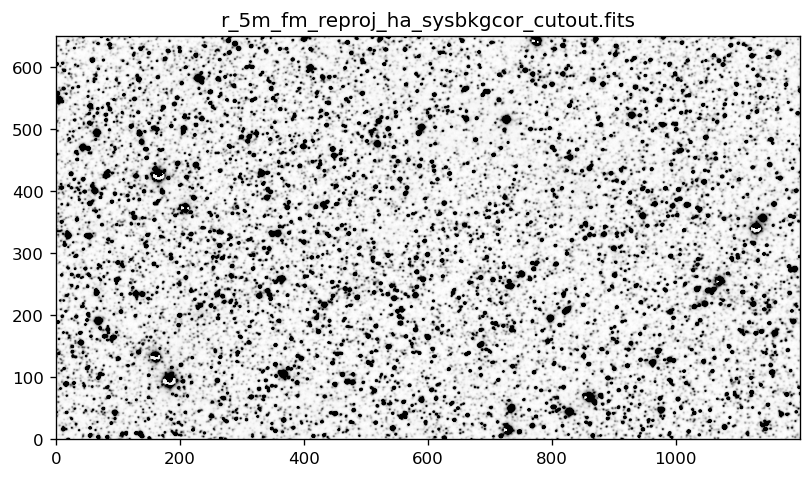

In [23]:
infile = folder + 'fm/r_5m_fm_reproj_ha_sysbkgcor.fits'
outfile = folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits'
fun_cutout(infile, outfile, centre_coordinates, shape)

In [24]:
print('sextractor ../fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC')

sextractor ../fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC


Set MJD-END to 58720.902306 from DATE-END'. [astropy.wcs.wcs]


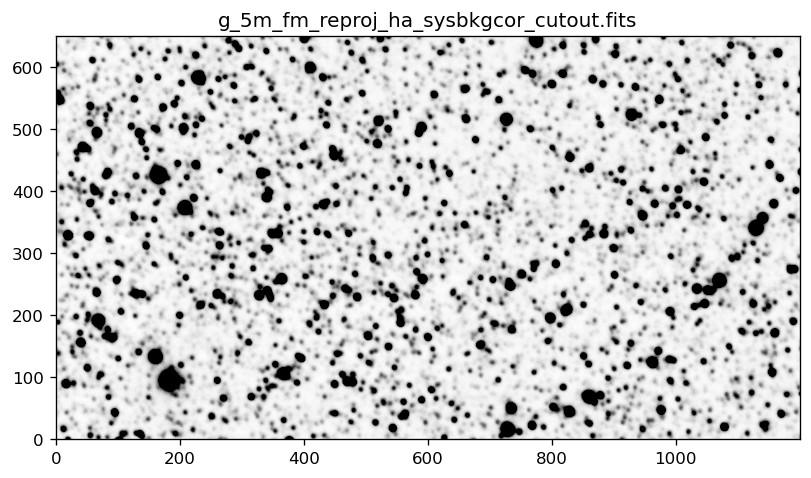

In [25]:
infile = folder + 'fm/g_5m_fm_reproj_ha_sysbkgcor.fits'
outfile = folder + 'fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout.fits'

fun_cutout(infile, outfile, centre_coordinates, shape)

In [26]:
print('sextractor ../fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC')

sextractor ../fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC


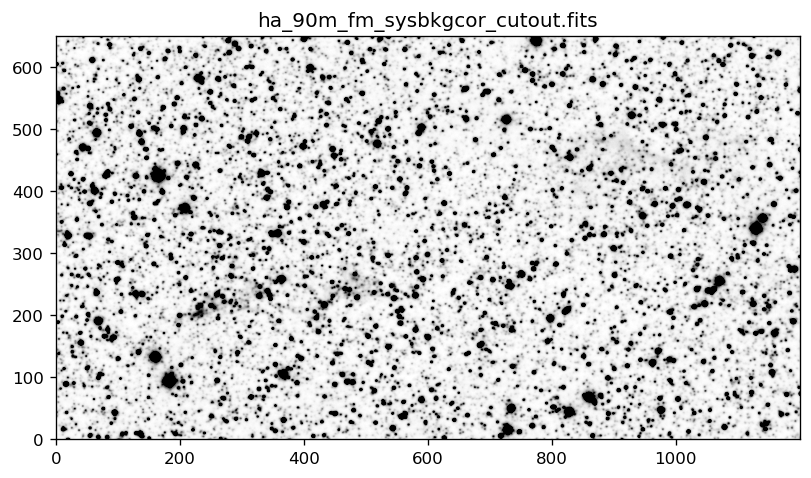

In [27]:
infile = folder + 'fm/ha_90m_fm_sysbkgcor.fits'
outfile = folder + 'fluxed/ha_90m_fm_sysbkgcor_cutout.fits'

fun_cutout(infile, outfile, centre_coordinates, shape)

In [28]:
print('sextractor ../fluxed/ha_90m_fm_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/ha_90m_fm_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC')

sextractor ../fluxed/ha_90m_fm_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/ha_90m_fm_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC


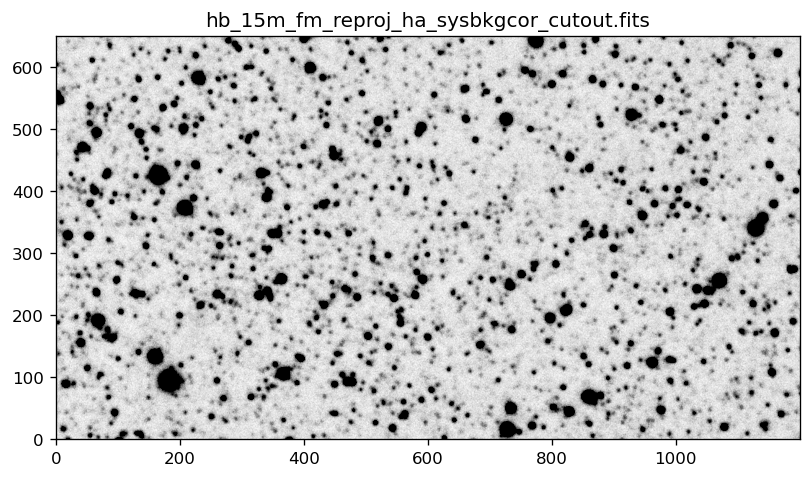

In [29]:
infile = folder + 'fm/hb_15m_fm_reproj_ha_sysbkgcor.fits'
outfile = folder + 'fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits'

fun_cutout(infile, outfile, centre_coordinates, shape)

In [30]:
print('sextractor ../fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC')

sextractor ../fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC


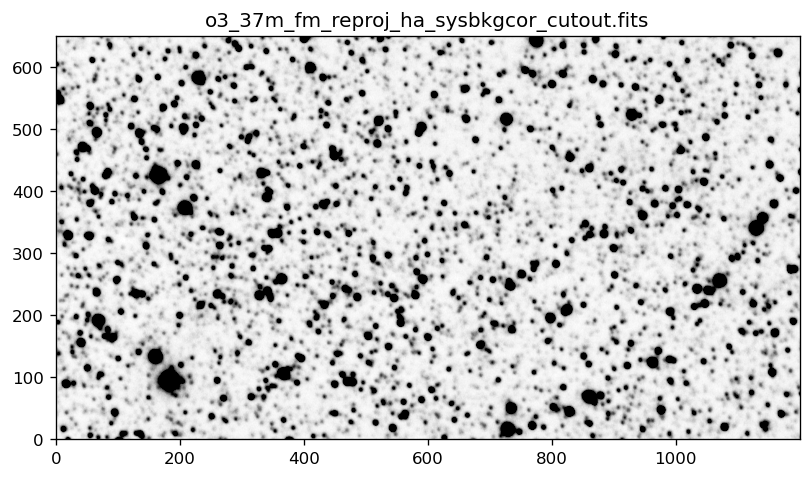

In [31]:
infile = folder + 'fm/o3_37m_fm_reproj_ha_sysbkgcor.fits'
outfile = folder + 'fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout.fits'

fun_cutout(infile, outfile, centre_coordinates, shape)

In [32]:
print('sextractor ../fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC')

sextractor ../fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC


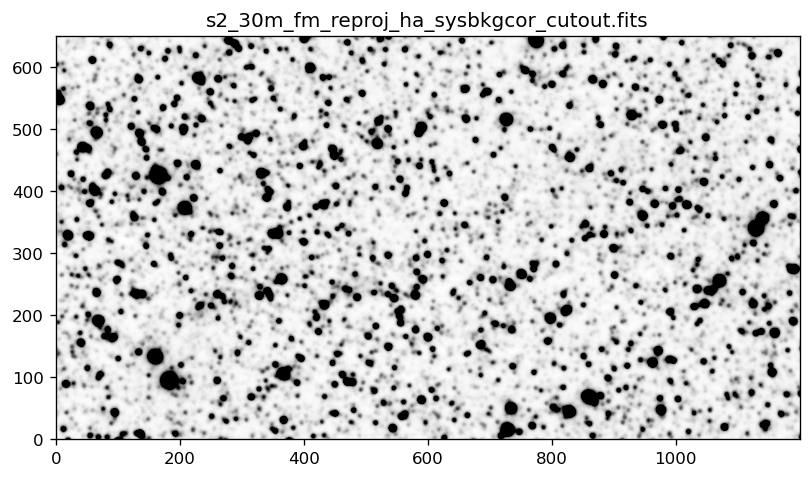

In [33]:
infile = folder + 'fm/s2_30m_fm_reproj_ha_sysbkgcor.fits'
outfile = folder + 'fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout.fits'

fun_cutout(infile, outfile, centre_coordinates, shape)

In [34]:
print('sextractor ../fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC')

sextractor ../fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout.fits -c default.sex -CATALOG_NAME ../fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout.fits.cat -CATALOG_TYPE FITS_LDAC


In [35]:
air_mass_r = 1.65
air_mass_g = 2.48
air_mass_ha = 1.69
air_mass_hb = 1.78
air_mass_s2 = 2.01
air_mass_o3 = 2.16

# R-band

r - fits data;
flags_r - mask for only clear detections;
coo_r - coordinates of INT stars;
coo_panstars - coodinates of panstars stars;

In [36]:
# Load the r-filter cutout region
# infile_r = folder + 'fm/r_5m_fm_reproj_ha.fits.cat'
infile_r = folder + 'fm/r_5m_fm_reproj_ha_sysbkgcor.fits.cat'
r = fits.getdata(infile_r,2)

In [37]:
r

FITS_rec([(     1,   68.31715, 2.7504625, -4.586324 , 0.04372258,  960.00806, 1.4548962e+00, 274.54502986, -24.29898414, 1.349635 , -5.1492577, 0.05605812,  114.73686,  5.9225903, 3.2785132,  18.015152, 1.5922939, 0.37197524,  105.7592 , 4.968103 , -5.0607953, 0.05101551, 0.5816649 , 24),
          (     2,  102.15667, 3.5490024, -5.0231667, 0.03772849,  300.99814, 1.2426752e+00, 274.61151053, -24.29892781, 3.5332205, -6.433753 , 0.03179502,  374.54263, 10.965553 , 5.540525 ,  15.768353, 2.9807038, 0.66450876,  151.17691, 4.809859 , -5.448714 , 0.03455228, 0.7192026 , 27),
          (     3,  112.0891 , 3.8862386, -5.1239085, 0.03765268,  583.789  , 1.8713031e+00, 274.58298268, -24.2989061 , 2.5445151, -6.0458555, 0.04121768,  262.02466,  9.9447975, 4.320272 ,  14.09203 , 1.5878912, 0.37023395,  148.04704, 5.2606783, -5.425999 , 0.03858974, 0.7426953 , 24),
          ...,
          (149505,  405.06363, 6.8288436, -6.518808 , 0.01830854, 2637.8245 , 6.4057290e+03, 274.37590025, -23.7102

In [38]:
# Filtering for clear detection by SExtractor
flags_r = r['FLAGS'] == 0

In [39]:
# # Opening the header to retrieve the WCS solution and applying to the X_IMAGE and Y_IMAGE From Sextractor catalogue file
coo_r = fun_get_INT_coo(infile_r, r)

In [40]:
# We can perform a Nearest neighbour matching within the coordinate object
idx_pansatars_r, d2d_panstars_r, d3d_panstars_r = coo_r[flags_r].match_to_catalog_sky(coo_panstars)

In [41]:
# Performing a quality cut for the sky match.
# 1) Only select those stars with a distance of less than 1 arcsec
# 2) The catalogue gives by default a magnitude of 99 to all sources 
#    without one, we use 30 for no particular reason, 
# 3) Further cut is made to avoid under or over-exposed stars

ssr = (d2d_panstars_r.arcsec < 1) & (panstars.rMeanPSFMag[idx_pansatars_r] <30.) & (~np.isnan(panstars.rMeanPSFMagErr[idx_pansatars_r]))
eer = ssr & (panstars.rMeanPSFMag[idx_pansatars_r] < 17) & (panstars.rMeanPSFMag[idx_pansatars_r] > 13)

print("Number of detected sources: {:.0f}".format(eer.sum()))

Number of detected sources: 735


### Flux calibration region
We select a 5'' cone region around the location, where we detect Ha emission. This extends beyond the cutout region which we display, in order to have sufficient number of stars. 

We do not use the whole 35'x35' image because it would make our star sample impractically large and we were also motivated to use point sources close-by to the region of interest.

INFO: Auto-setting vmin to -1.464e+00 [aplpy.core]
INFO: Auto-setting vmax to  2.103e+02 [aplpy.core]


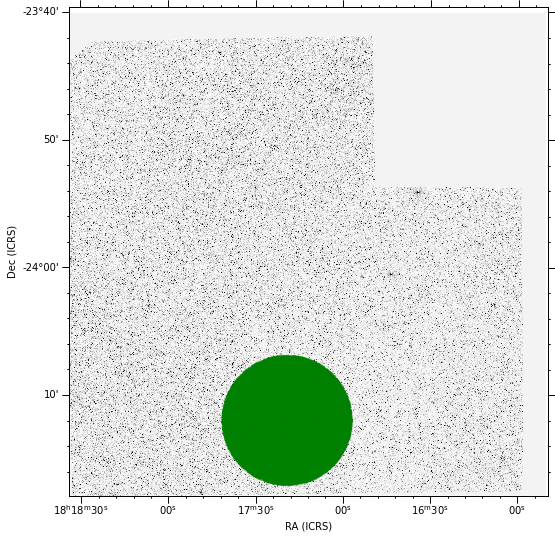

In [42]:
# A check whether panstars catalogue is actually in correct FoV
# gc = aplpy.FITSFigure(folder + 'fluxed/r_5m_fm_reproj_ha_cutout.fits')
gc = aplpy.FITSFigure(folder + 'fm/r_5m_fm_reproj_ha.fits')
gc.show_colorscale(cmap='Greys',stretch='arcsinh')
#Plot PANSTARS sources
gc.show_markers(coo_panstars.ra.deg, coo_panstars.dec.deg, edgecolor='green', facecolor='none', 
                marker='o', s=10, alpha=0.5) 
gc.set_theme('publication')

INFO: Auto-setting vmin to -1.378e+00 [aplpy.core]
INFO: Auto-setting vmax to  2.416e+02 [aplpy.core]


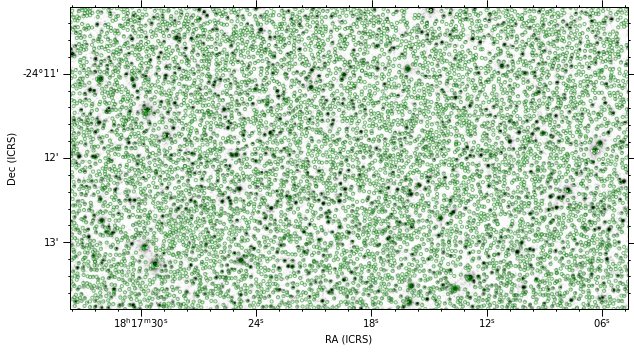

In [43]:
# A check whether panstars catalogue is actually in correct FoV
gc = aplpy.FITSFigure(folder + 'fluxed/r_5m_fm_reproj_ha_cutout.fits')
# gc = aplpy.FITSFigure(folder + 'fm/r_5m_fm_reproj_ha.fits')
gc.show_colorscale(cmap='Greys',stretch='arcsinh')
#Plot PANSTARS sources
gc.show_markers(coo_panstars.ra.deg, coo_panstars.dec.deg, edgecolor='green', facecolor='none', 
                marker='o', s=10, alpha=0.5) 
gc.set_theme('publication')

In [44]:
# Calculate magnitude including backgroud (otherwise background would be subtracted 2 times)
r_mag, r_mag_err = fun_calc_magnitude_z(r, flags_r,air_mass_r,0.09)

In [45]:
args_r = (panstars.rMeanPSFMag[idx_pansatars_r][eer], r_mag[eer], r_mag_err[eer])
zp_r, out_r, r_clip_mask = fun_fit_zp(args_r)
out_r

Text(0.5, 0, 'Pan-STARRS r band')

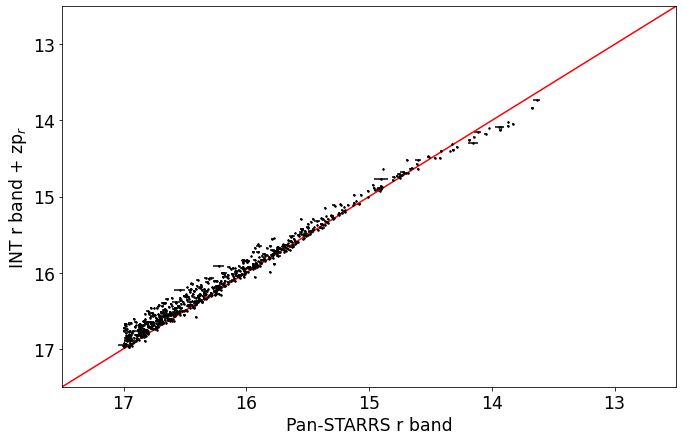

In [46]:
# Plotting observed vs expected panstars stars. This *may* 
# contain variable stars.
fig = plt.figure(figsize=(11,7))
plt.rcParams.update(params_color_plot)
plt.errorbar(panstars.rMeanPSFMag[idx_pansatars_r][eer][r_clip_mask],r_mag[eer][r_clip_mask]-zp_r,
             yerr=r_mag_err[eer][r_clip_mask],
             xerr=panstars.rMeanPSFMagErr[idx_pansatars_r][eer][r_clip_mask],
             color='k',ls="None",marker="o",ms=1.5)

# plt.errorbar(panstars.rMeanPSFMag[idx_pansatars_r][eer][~r_clip_mask],r_mag[eer][~r_clip_mask]-zp_r,
#              yerr=r_mag_err[eer][~r_clip_mask],
#              xerr=panstars.rMeanPSFMagErr[idx_pansatars_r][eer][~r_clip_mask],
#              color='green',ls="None",marker="o",ms=1.5)

xx = np.linspace(0,20,100)
plt.plot(xx,xx,'r')
plt.xlim(17.5,12.5)
plt.ylim(17.5,12.5)
plt.ylabel("INT r band + zp$_r$")
plt.xlabel("Pan-STARRS r band")
# plt.savefig("test_r_stars.png")
# plt.savefig(folder+'figures/fig_g7_color_calib_r.pdf', dpi=150, bbox_inches='tight')

### Zero point correction

In [47]:
# We take star surface area into account
star_surface_area_r = r[flags_r][eer]['FLUX_RADIUS']**2
print(np.mean(star_surface_area_r), np.std(star_surface_area_r))

3.6308076 0.92582935


In [48]:
# Theli oversubtracted background - we estimate these values puts it closer to reality
# We can do this because the SExtractor estimated fluOnl2
bkg_sys_cor_r = 1.0 # read-out from the image

In [49]:
# Corrected r flux. 
hdulist = fits.open(folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_r_flux_cor = hdulist[0].data * (10**(-0.4*(-zp_r + 48.6))/ np.mean(star_surface_area_r))/1e-26

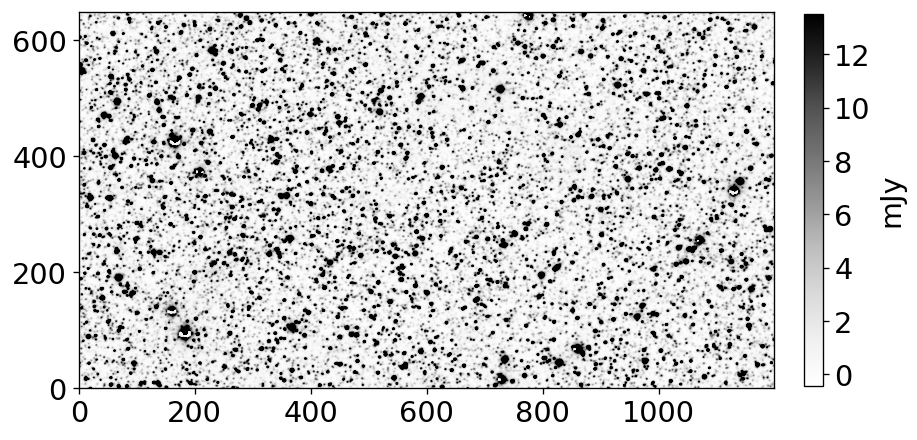

In [50]:
data_input = hdulist[0].data

fig = plt.figure(figsize=(8,8),dpi=120)
ax = plt.subplot(111)#, projection=cutout.wcs)
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax.imshow(data_input, origin='lower', cmap=cmap, norm=ImageNormalize(data_input, ZScaleInterval()))
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.04, orientation="vertical", label='mJy')

plt.show()
plt.close()

In [51]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction. Fitted zp_r='+str(zp_r)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_r_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout_fluxed.fits', overwrite=True)

# G filter

In [52]:
# Load the g-filter cutout region
# infile_g = folder + 'fm/g_5m_fm_reproj_ha.fits.cat'
infile_g = folder + 'fm/g_5m_fm_reproj_ha_sysbkgcor.fits.cat'
g = fits.getdata(infile_g,2)

# Flag filtering
flags_g = g['FLAGS'] == 0

# Make coordinate list 
coo_g = fun_get_INT_coo(infile_g, g)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-END to 58720.902306 from DATE-END'. [astropy.wcs.wcs]


In [53]:
# We can perform a Nearest neighbour matching within the coordinate object
idx_pansatars_g, d2d_panstars_g, d3d_panstars_g = coo_g[flags_g].match_to_catalog_sky(coo_panstars)
len(idx_pansatars_g)

30649

In [54]:
# Performing a quality cut for the sky match.
# 1) Only select those stars with a distance of less than 1 arcsec
# 2) The catalogue gives by default a magnitude of 99 to all sources 
#    without one, we use 30 for no particular reason, 
# 3) Further cut is made to avoid under or over-exposed stars

ssg = (d2d_panstars_g.arcsec < 1) & (panstars.gMeanPSFMag[idx_pansatars_g] <30.) & (~np.isnan(panstars.gMeanPSFMag[idx_pansatars_g])) 
eeg = ssg & (panstars.gMeanPSFMag[idx_pansatars_g] < 17) & (panstars.gMeanPSFMag[idx_pansatars_g] > 13)

print("Number of detected sources: {:.0f}".format(eeg.sum()))

Number of detected sources: 225


In [55]:
# Checking that both arrays have the same size (they should...)
print(g[flags_g]['MAG_AUTO'][eeg].size)
print(panstars.gMeanPSFMag[idx_pansatars_g][eeg].size)

225
225


In [56]:
# Calculate magnitude including backgroud (otherwise background would be subtracted 2 times)
g_mag, g_mag_err = fun_calc_magnitude_z(g, flags_g,air_mass_g, 0.19) # airmass, extinction (1.6)

In [57]:
args = (panstars.gMeanPSFMag[idx_pansatars_g][eeg], g_mag[eeg], g_mag_err[eeg])
zp_g, out_g, g_clip_mask = fun_fit_zp(args)
out_g

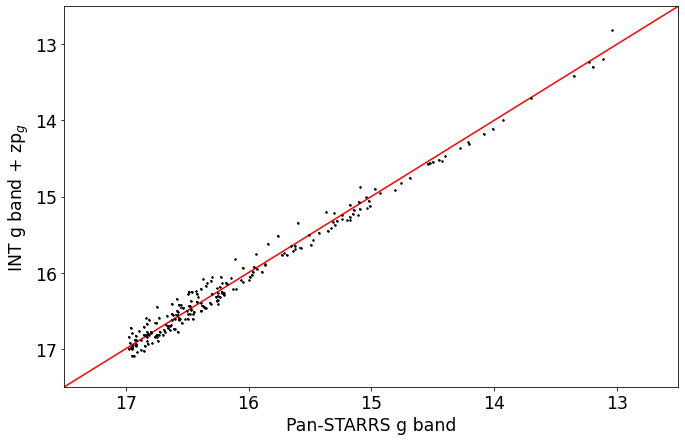

In [58]:
# Plotting observed vs expected panstars stars. This *may* 
# contain variable stars.
fig = plt.figure(figsize=(11,7))
plt.rcParams.update(params_color_plot)
plt.errorbar(panstars.gMeanPSFMag[idx_pansatars_g][eeg][g_clip_mask],g_mag[eeg][g_clip_mask]-zp_g,
             yerr=g_mag_err[eeg][g_clip_mask],
             xerr=panstars.gMeanPSFMagErr[idx_pansatars_g][eeg][g_clip_mask],
             color='k',ls="None",marker="o",ms=1.5)
# plt.errorbar(panstars.gMeanPSFMag[idx_pansatars_g][eeg][~g_clip_mask],g_mag[eeg][~g_clip_mask]-zp_g,
#              yerr=g_mag_err[eeg][~g_clip_mask],
#              xerr=panstars.gMeanPSFMagErr[idx_pansatars_g][eeg][~g_clip_mask],
#              color='green',ls="None",marker="o",ms=1.5)
xx = np.linspace(0,20,100)
plt.plot(xx,xx,'r')
plt.xlim(17.5,12.5)
plt.ylim(17.5,12.5)
plt.ylabel("INT g band + zp$_g$")
plt.xlabel("Pan-STARRS g band")
# plt.savefig("test_r_stars.png")
plt.savefig(folder + '/figures/fig_g7_color_calib_g.pdf', dpi=150, bbox_inches='tight')

### Zero point correction

In [59]:
star_surface_area_g = g[flags_g][eeg]['FLUX_RADIUS']**2
print(np.mean(star_surface_area_g), np.std(star_surface_area_g))

17.725569 4.9749756


In [60]:
hdulist = fits.open(folder + 'fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_g_flux_cor = hdulist[0].data * (10**(-0.4*(-zp_g + 48.6))/ np.mean(star_surface_area_g))/1e-26

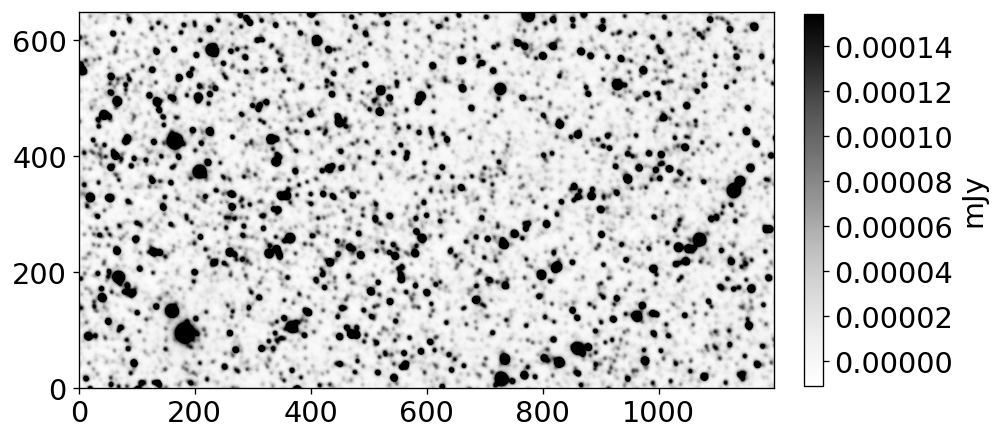

In [61]:
fig = plt.figure(figsize=(8,8),dpi=120)
ax = plt.subplot(111)#, projection=cutout.wcs)
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax.imshow(data_g_flux_cor, origin='lower', cmap=cmap, norm=ImageNormalize(data_g_flux_cor, ZScaleInterval()))
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.04, orientation="vertical", label='mJy')

plt.show()
plt.close()

In [62]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction. Fitted zp_g='+str(zp_g)

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_g_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/g_5m_fm_reproj_ha_sysbkgcor_cutout_fluxed.fits', overwrite=True)

# Halpha

In [63]:
# Load the ha-filter cutout region
infile_ha = folder + 'fm/ha_90m_fm.fits.cat'
infile_ha = folder + 'fm/ha_90m_fm_sysbkgcor.fits.cat'
ha = fits.getdata(infile_ha,2)

# Filtering for clear detection by SExtractor
flags_ha = ha['FLAGS'] == 0

# Opening the header to retrieve the WCS solution and applying to the X_IMAGE and Y_IMAGE from Sextractor catalogue file
coo_ha = fun_get_INT_coo(infile_ha, ha)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-END to 58720.902306 from DATE-END'. [astropy.wcs.wcs]


In [64]:
# We can perform a Nearest neighbour matching within the
# coordinate object
idx_pansatars_ha, d2d_panstars_ha, d3d_panstars_ha = coo_ha[flags_ha].match_to_catalog_sky(coo_panstars)
idx_pansatars_ha.size

66266

In [65]:
# Performing a quality cut for the sky match.
# 1) Only select those stars with a distance of less than 1 arcsec
# 2) The catalogue gives by default a magnitude of 99 to all sources 
#    without one, we use 30 for no particular reason, 
# 3) Further cut is made to avoid under or over-exposed stars

ss_ha = (d2d_panstars_ha.arcsec < 1) & (panstars.rMeanPSFMag[idx_pansatars_ha] <30.) & (~np.isnan(panstars.rMeanPSFMagErr[idx_pansatars_ha]))
ee_ha = ss_ha & (panstars.rMeanPSFMag[idx_pansatars_ha] < 17) & (panstars.rMeanPSFMag[idx_pansatars_ha] > 13)

print("Number of detected sources: {:.0f}".format(ee_ha.sum()))

Number of detected sources: 815


In [66]:
# # Calculate temperature for used stars
panstars['temp_K'] = panstars.loc[idx_pansatars_ha][ee_ha].apply(lambda row: fun_get_temp(row)[0], axis=1)
# panstars['temp_K_err'] = panstars.loc[idx_pansatars_ha][ee_ha].apply(lambda row: fun_get_temp(row)[1], axis=1)
panstars['a1'] = panstars.loc[idx_pansatars_ha][ee_ha].apply(lambda row: fun_get_temp(row)[2], axis=1)
panstars['redchi'] = panstars.loc[idx_pansatars_ha][ee_ha].apply(lambda row: fun_get_temp(row)[3], axis=1)

### We look at the distribution of fitted stars

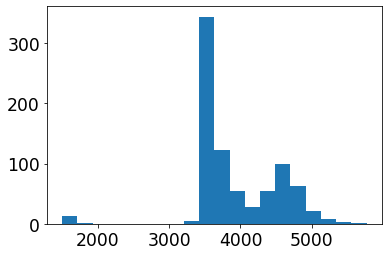

In [67]:
plt.hist(panstars.loc[idx_pansatars_ha][ee_ha]['temp_K'],bins=20)
plt.show()

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:853: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'a1')

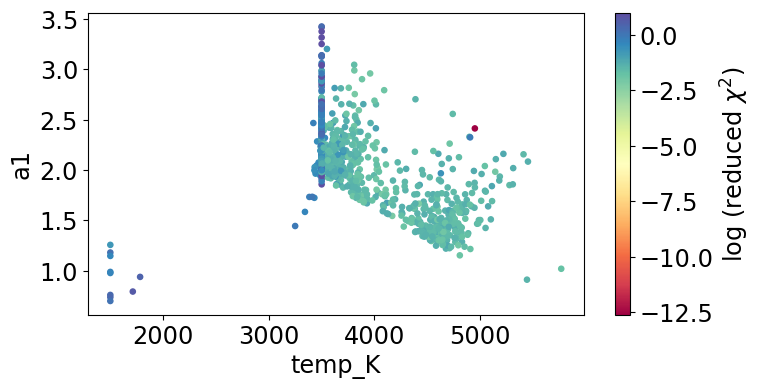

In [68]:
plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars['temp_K'],panstars['a1'], s=14, vmax=1, c=np.log10(panstars['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

#### There is a high concentration of high reduced chisq stars fitted at limiting 3500K. 
#### They are likely stars that are even colder than 3500K. For safety we make a temperature cut at 3750K

In [69]:
temp_cut_ha = panstars.loc[idx_pansatars_ha][ee_ha]['temp_K'] > 3750

Text(0, 0.5, 'a1')

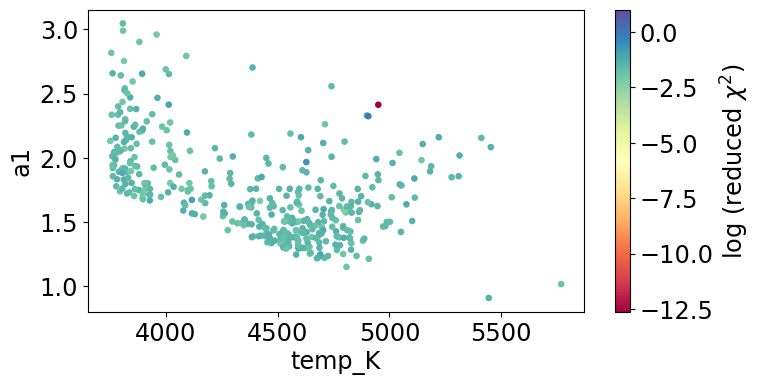

In [70]:
plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_ha][ee_ha][temp_cut_ha]['temp_K'],panstars.loc[idx_pansatars_ha][ee_ha][temp_cut_ha]['a1'], s=14, vmax=1, c=np.log10(panstars.loc[idx_pansatars_ha][ee_ha][temp_cut_ha]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

#### Closer look

In [71]:
panstars.loc[idx_pansatars_ha][ee_ha].sort_values(by='temp_K',ascending=True).iloc[:10]

,Unnamed: 0,objID,raMean,decMean,nDetections,ng,nr,ni,nz,ny,...,rMeanPSFMagErr,iMeanPSFMag,iMeanPSFMagErr,zMeanPSFMag,zMeanPSFMagErr,yMeanPSFMag,yMeanPSFMagErr,temp_K,a1,redchi
8573,8573,78972743860330654,274.386016,-24.191359,67,16,12,11,12,16,...,0.000611,16.069901,0.004672,15.6533,0.007406,15.3669,0.003809,1500.000000,0.804528,NaN
225,225,78882742762886264,274.276253,-24.261693,85,14,9,16,23,23,...,0.001747,15.750100,0.002192,15.2640,0.018122,15.0259,0.005424,1500.000001,0.891374,NaN
8155,8155,78932743438575856,274.343864,-24.220353,69,15,11,14,13,16,...,0.000536,15.250000,0.001068,14.8231,0.002557,14.5641,0.005084,1500.000003,1.124216,NaN
4212,4212,78932742716182444,274.271633,-24.223242,79,14,12,14,20,19,...,0.002912,15.754400,0.012255,15.3151,0.000517,15.0494,0.003824,1500.000004,0.883866,NaN
11079,11079,78972742848138154,274.284810,-24.185133,63,11,10,11,16,15,...,0.002154,14.993400,0.005126,14.6403,0.010526,14.4445,0.005603,1500.000004,1.256008,0.185982
9899,9899,78962743680407289,274.368026,-24.194167,69,16,12,14,13,14,...,0.010616,15.161000,0.005570,14.8420,0.002948,14.6634,0.008502,1500.000054,1.146096,0.449167
5219,5219,78882743557385214,274.355764,-24.262575,68,11,8,12,17,20,...,0.002051,15.493800,0.003182,15.0749,0.001612,14.7923,0.005536,1500.000064,0.987469,0.534059
4679,4679,78912743602337598,274.360230,-24.235566,79,16,12,14,19,18,...,0.009367,15.064000,0.012749,14.7770,0.004691,14.6150,0.011497,1500.000176,1.180039,1.425233
3891,3891,78902742968916607,274.296910,-24.244774,79,14,10,16,19,20,...,0.001280,16.116501,0.002914,15.6415,0.006888,15.3570,0.007483,1500.000247,0.758798,2.045962
14018,14018,78892743614193264,274.361411,-24.255851,59,11,8,11,14,15,...,0.001414,16.202700,0.007357,15.7722,0.002822,15.4820,0.006152,1500.000292,0.735728,2.518699


Text(0.5, 1.0, 'row11079, SED for temperature T =1500.000000476484')

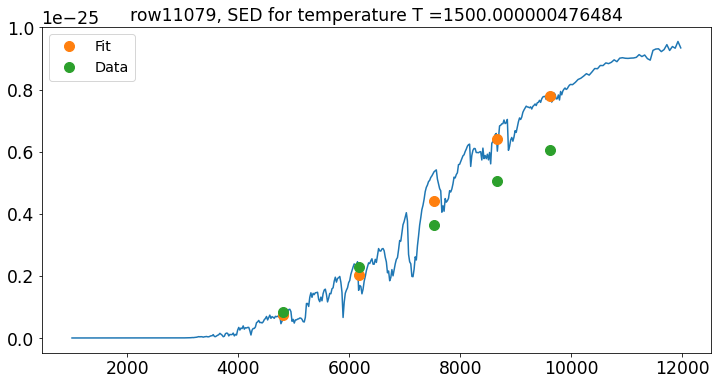

In [72]:
row_loc = 11079
row = panstars.loc[idx_pansatars_ha][ee_ha].loc[row_loc]
mag = np.array([row['gMeanPSFMag'],row['rMeanPSFMag'],row['iMeanPSFMag'],row['zMeanPSFMag'],row['yMeanPSFMag']])
mag_err = np.array([row['gMeanPSFMagErr'],row['rMeanPSFMagErr'],row['iMeanPSFMagErr'],row['zMeanPSFMagErr'],row['yMeanPSFMagErr']])
Flux = 10** ((mag + 48.6)/-2.5)
Flux_err = (mag_err*Flux)/1.0857   *10
out = minimize(residual, fit_params, kws={'data': Flux, 'eps':Flux_err}, nan_policy='omit') # there is one filter that has nan values
out

wave_panstars_filters = np.array([4810, 6170, 7520, 8660, 9620])
wave = np.fromstring(kurucz['wave'][0][1:-1], dtype=np.float, sep=' ')

plt.figure(figsize=(12,6))
plt.plot(wave, star_sed(out.params['tempu'].value)*10**out.params['a1'].value)

plt.plot(wave_panstars_filters, residual(out.params),'.', ms=20, label='Fit')
plt.plot(wave_panstars_filters, Flux,'.',ms=20, label='Data')
plt.legend()

plt.title('row'+str(row_loc)+', SED for temperature T ='+str(out.params['tempu'].value))

As can be seen, line with fitted temperature of 1500 K is a bad fit to the data (green points)


#### End of closer look

### Number of avaiable sources is cut down further as we use only stars with all filters avaiable for temperature fitting

In [73]:
# Checking that both arrays have the same size (they should...)
print(ha[flags_ha]['MAG_AUTO'][ee_ha][temp_cut_ha].size)
print(panstars.rMeanPSFMag[idx_pansatars_ha][ee_ha][temp_cut_ha].size)

387
387


### We interpolate Ha magnitude from the fitted temperature

In [74]:
## We do not use airmass correction because this is transformation from Panstars catalogue
ha_calibrated = panstars.loc[idx_pansatars_ha][ee_ha][temp_cut_ha].apply(lambda row: fun_pogson_erg_to_mag_z(star_interp_INT(row['temp_K'])[2],row['a1'],0,0), axis=1)

In [75]:
# Calculate magnitude including backgroud (otherwise background would be subtracted 2 times)
ha_mag, ha_mag_err = fun_calc_magnitude_z(ha, flags_ha, air_mass_ha, 0.09)

In [76]:
# args = (panstars.rMeanPSFMag[idx_pansatars_ha][ee_ha], ha_mag[ee_ha], ha_mag_err[ee_ha])
args = (ha_calibrated, ha_mag[ee_ha][temp_cut_ha], ha_mag_err[ee_ha][temp_cut_ha])
zp_ha, out_ha, ha_cilp_mask = fun_fit_zp(args)
out_ha

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:1143: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


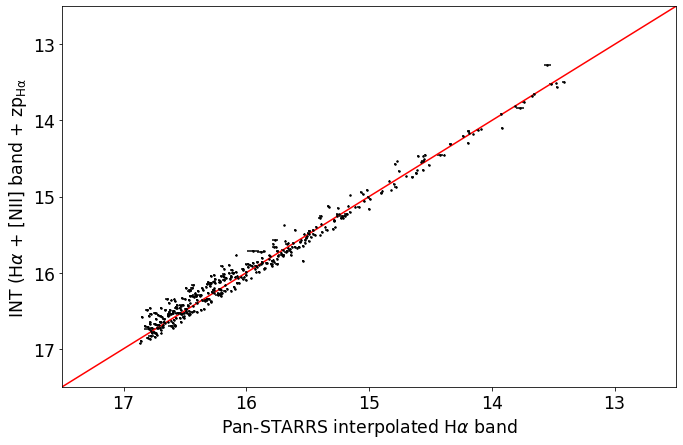

In [77]:
# Plotting observed vs expected panstars stars. This *may* 
# contain variable stars.
fig = plt.figure(figsize=(11,7))
plt.rcParams.update(params_color_plot)
plt.errorbar(ha_calibrated[idx_pansatars_ha][ee_ha][temp_cut_ha][ha_cilp_mask],ha_mag[ee_ha][temp_cut_ha][ha_cilp_mask]-zp_ha,
             yerr=ha_mag_err[ee_ha][temp_cut_ha][ha_cilp_mask],
             xerr=panstars.rMeanPSFMagErr[idx_pansatars_ha][ee_ha][temp_cut_ha][ha_cilp_mask],
             color='k',ls="None",marker="o",ms=1.5)
# plt.errorbar(ha_calibrated[idx_pansatars_ha][ee_ha][temp_cut_ha][~ha_cilp_mask],ha_mag[ee_ha][temp_cut_ha][~ha_cilp_mask]-zp_ha,
#              yerr=ha_mag_err[ee_ha][temp_cut_ha][~ha_cilp_mask],
#              xerr=panstars.rMeanPSFMagErr[idx_pansatars_ha][ee_ha][temp_cut_ha][~ha_cilp_mask],
#              color='green',ls="None",marker="o",ms=1.5)
xx = np.linspace(0,20,100)
plt.plot(xx,xx,'r')
plt.xlim(17.5,12.5)
plt.ylim(17.5,12.5)
plt.ylabel(r"INT (H$\alpha$ + [NII] band + zp$_\mathrm{H\alpha}$")
plt.xlabel(r"Pan-STARRS interpolated H$\alpha$ band")
# plt.savefig("test_r_stars.png")
plt.savefig(folder + '/figures/fig_g7_color_calib_ha.pdf', dpi=150, bbox_inches='tight')

### Zero point correction

In [78]:
zp_ha - zp_r

2.96612221818987

In [79]:
star_surface_area_ha = ha[flags_ha][ee_ha][temp_cut_ha]['FLUX_RADIUS']**2
print(np.mean(star_surface_area_ha), np.std(star_surface_area_ha))

5.1242776 1.5199647


In [80]:
hdulist = fits.open(folder + 'fluxed/ha_90m_fm_sysbkgcor_cutout.fits')
data_ha_flux_cor = hdulist[0].data * (10**(-0.4*(-zp_ha + 48.6))/ np.mean(star_surface_area_ha))/1e-26

In [81]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction. Fitted zp_ha='+str(zp_ha)

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_ha_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/ha_90m_fm_sysbkgcor_cutout_fluxed.fits', overwrite=True)

### Continuum subtraction

Before the continuum can be subtracted from the narrowband filter we need to get them down to the same resolution. We do this using gaussian smoothing on higher resolution image. In this case it is r-filter.

Used sigma is obtained by comparing the PSFs (FWHMs) calculated by SExtractor. Individual values are obtained by hands-on try-and-match method by comparing FWHM distributions after every iteration. The final iteration is done in the script "zenodo_g7_image_diagnostics.ipynb" 

In [82]:
# Need to smooth r filter down to Ha resolution
hdulist = fits.open(folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_r_flux_cor_ha = gaussian_filter(hdulist[0].data, sigma=0.54)  * (10**(-0.4*(-zp_r + 48.6))/ np.mean(star_surface_area_ha))/1e-26

In [83]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction of smoothed image. Fitted zp_r='+str(zp_r)
new_header['history'] = 'Image was smoothed by sigma=0.54 in order to match PSF of Ha filter'

# new_header
new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_r_flux_cor_ha
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout_fluxed_sm054.fits', overwrite=True)

## Continuum subtracted image Ha

In [84]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'ha - r'

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_ha_flux_cor - data_r_flux_cor_ha
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/diff_ha_fluxed.fits', overwrite=True)

<Figure size 432x288 with 0 Axes>

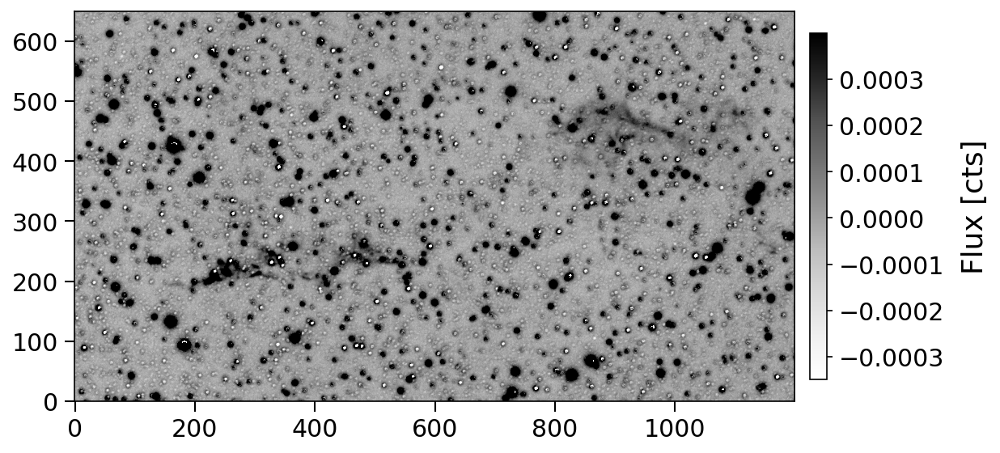

In [85]:
diff_ha = data_ha_flux_cor - data_r_flux_cor_ha 
plt.clf()
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
         }
fig = plt.figure(figsize=(8,5), dpi=150)
plt.subplots_adjust(wspace=0.)
plt.rcParams.update(params)

ax = plt.subplot((111)) 
ax.tick_params(axis='x', which='major', width=1.00, length=6, labelsize='x-large', top=False,
               bottom=True)
ax.tick_params(axis='y', which='major', width=1.00, length=6, labelsize='x-large', right=False,
               left=True)
im = ax.imshow(diff_ha, origin='lower',cmap='Greys', norm=ImageNormalize(data_ha_flux_cor - data_r_flux_cor_ha , ZScaleInterval()))

cbar = fig.colorbar(im, ax=ax, fraction=0.023, pad=0.02, orientation="vertical")
cbar.set_label(r'Flux [cts]', rotation=90, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')

### Test whether systematic correction went okay
Stars have been mostly subtracted (to lesser or greater degree) and we would expect the maximum of the histogram to be centered close to 0

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

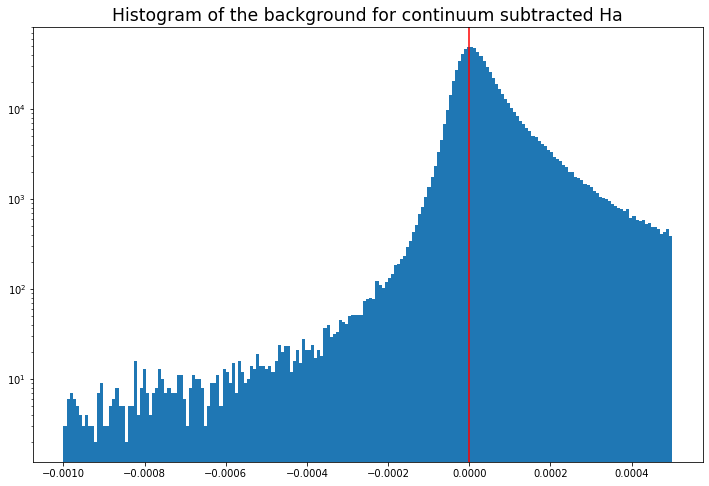

In [86]:
diff_ha = data_ha_flux_cor - data_r_flux_cor_ha 
bins = np.linspace(-1e-3,5e-4,200)
plt.figure(figsize=(12,8))
h=plt.hist(diff_ha.flatten(),bins=bins)
plt.axvline(x=0,c='red')
# plt.xscale('log')
plt.yscale('log')
plt.title('Histogram of the background for continuum subtracted Ha')
plt.plot

# Repeat procedure for every filter

# SII

In [87]:
# Load the SII-filter cutout region
# infile_s2 = folder + 'fluxed/s2_30m_fm_reproj_ha_cutout.fits.cat'
infile_s2 = folder + 'fm/s2_30m_fm_reproj_ha_sysbkgcor.fits.cat'
s2 = fits.getdata(infile_s2,2)

# Filtering for clear detection by SExtractor
flags_s2 = s2['FLAGS'] == 0

# Opening the header to retrieve the WCS solution and applying to the X_IMAGE and Y_IMAGE from Sextractor catalogue file
coo_s2 = fun_get_INT_coo(infile_s2, s2)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-END to 58720.902306 from DATE-END'. [astropy.wcs.wcs]


In [88]:
# We can perform a Nearest neighbour matching within the
# coordinate object
idx_pansatars_s2, d2d_panstars_s2, d3d_panstars_s2 = coo_s2[flags_s2].match_to_catalog_sky(coo_panstars)
len(idx_pansatars_s2)

29180

In [89]:
# Performing a quality cut for the sky match.
# 1) Only select those stars with a distance of less than 1 arcsec
# 2) The catalogue gives by default a magnitude of 99 to all sources 
#    without one, we use 30 for no particular reason, 
# 3) Further cut is made to avoid under or over-exposed stars

ss_s2 = (d2d_panstars_s2.arcsec < 1) & (panstars.rMeanPSFMag[idx_pansatars_s2] <30.) & (~np.isnan(panstars.rMeanPSFMagErr[idx_pansatars_s2]))
ee_s2 = ss_s2 & (panstars.rMeanPSFMag[idx_pansatars_s2] < 17) & (panstars.rMeanPSFMag[idx_pansatars_s2] > 13)

print("Number of detected sources: {:.0f}".format(ee_s2.sum()))

Number of detected sources: 854


In [90]:
# Calculate temperature for used stars
panstars['temp_K'] = panstars.loc[idx_pansatars_s2][ee_s2].apply(lambda row: fun_get_temp(row)[0], axis=1)
# panstars['temp_K_err'] = panstars.loc[idx_pansatars_s2][ee_s2].apply(lambda row: fun_get_temp(row)[1], axis=1)
panstars['a1'] = panstars.loc[idx_pansatars_s2][ee_s2].apply(lambda row: fun_get_temp(row)[2], axis=1)

Text(0, 0.5, 'a1')

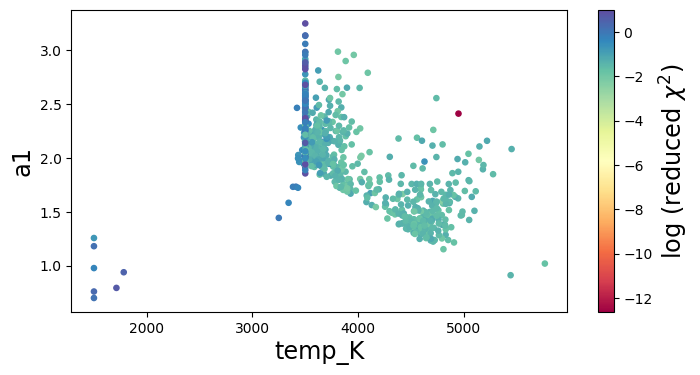

In [91]:
plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_s2][ee_s2]['temp_K'],panstars.loc[idx_pansatars_s2][ee_s2]['a1'], s=14, vmax=1, c=np.log10(panstars.loc[idx_pansatars_s2][ee_s2]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

Text(0, 0.5, 'a1')

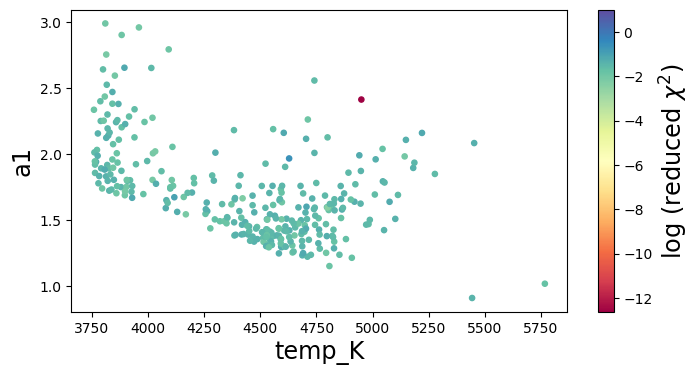

In [92]:
temp_cut_s2 = panstars.loc[idx_pansatars_s2][ee_s2]['temp_K'] > 3750

plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_s2][ee_s2][temp_cut_s2]['temp_K'],panstars.loc[idx_pansatars_s2][ee_s2][temp_cut_s2]['a1'], s=14, vmax=1, 
                 c=np.log10(panstars.loc[idx_pansatars_s2][ee_s2][temp_cut_s2]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

In [93]:
# Checking that both arrays have the same size (they should...)
print(s2[flags_s2]['MAG_AUTO'][ee_s2][temp_cut_s2].size)
print(panstars.rMeanPSFMag[idx_pansatars_s2][ee_s2][temp_cut_s2].size)

397
397


In [94]:
s2_calibrated = panstars.loc[idx_pansatars_s2][ee_s2][temp_cut_s2].apply(lambda row: fun_pogson_erg_to_mag_z(star_interp_INT(row['temp_K'])[5],row['a1'],0,0 ), axis=1)

panstars['s2_SED'] = panstars.loc[idx_pansatars_s2][ee_s2][temp_cut_s2].apply(lambda row: fun_pogson_erg_to_mag_z(star_interp_INT(row['temp_K'])[5],row['a1'],0,0 ), axis=1)
panstars['r_SED'] = panstars.loc[idx_pansatars_s2][ee_s2][temp_cut_s2].apply(lambda row: fun_pogson_erg_to_mag_z(star_interp_INT(row['temp_K'])[1],row['a1'],0,0 ), axis=1)

In [95]:
# Calculate magnitude including backgroud (otherwise background would be subtracted 2 times)
s2_mag, s2_mag_err = fun_calc_magnitude_z(s2, flags_s2, air_mass_s2, 0.09)

In [96]:
args = (s2_calibrated[idx_pansatars_s2][ee_s2][temp_cut_s2], s2_mag[ee_s2][temp_cut_s2], s2_mag_err[ee_s2][temp_cut_s2])
zp_s2, out_s2, s2_clip_mask = fun_fit_zp(args)
out_s2

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:1143: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


In [97]:
zp_r - zp_s2

-3.006410942310332

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:1143: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


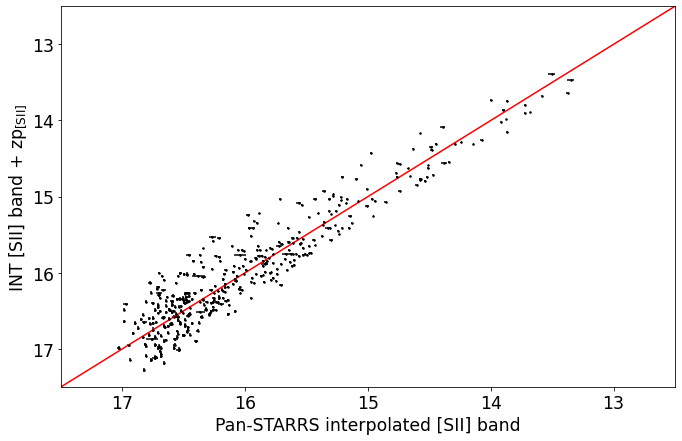

In [98]:
# Plotting observed vs expected panstars stars. This *may* 
# contain variable stars.
fig = plt.figure(figsize=(11,7))
plt.rcParams.update(params_color_plot)
plt.errorbar(s2_calibrated[idx_pansatars_s2][ee_s2][temp_cut_s2][s2_clip_mask],s2_mag[ee_s2][temp_cut_s2][s2_clip_mask]-zp_s2,
             yerr=s2_mag_err[ee_s2][temp_cut_s2][s2_clip_mask],
             xerr=panstars.rMeanPSFMagErr[idx_pansatars_s2][ee_s2][temp_cut_s2][s2_clip_mask],
             color='k',ls="None",marker="o",ms=1.5)
# plt.errorbar(s2_calibrated[idx_pansatars_s2][ee_s2][temp_cut_s2][~s2_clip_mask],s2_mag[ee_s2][temp_cut_s2][~s2_clip_mask]-zp_s2,
#              yerr=s2_mag_err[ee_s2][temp_cut_s2][~s2_clip_mask],
#              xerr=panstars.rMeanPSFMagErr[idx_pansatars_s2][ee_s2][temp_cut_s2][~s2_clip_mask],
#              color='green',ls="None",marker="o",ms=1.5)
xx = np.linspace(0,20,100)
plt.plot(xx,xx,'r')
plt.xlim(17.5,12.5)
plt.ylim(17.5,12.5)
plt.ylabel(r"INT [SII] band + zp$_\mathrm{[SII]}$")
plt.xlabel(r"Pan-STARRS interpolated [SII] band")
# plt.savefig("test_r_stars.png")
plt.savefig(folder + '/figures/fig_g7_color_calib_s2.pdf', dpi=150, bbox_inches='tight')

In [99]:
star_surface_area_s2 = s2[flags_s2][ee_s2][temp_cut_s2]['FLUX_RADIUS']**2
print(np.mean(star_surface_area_s2), np.std(star_surface_area_s2))

20.063942 8.703399


In [100]:
# The real background has values around -0.12 ct/s. We manually correct for it 
hdulist = fits.open(folder + 'fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_s2_flux_cor = hdulist[0].data * (10**(-0.4*(-zp_s2 + 48.6)) / np.mean(star_surface_area_s2))    / 1e-26

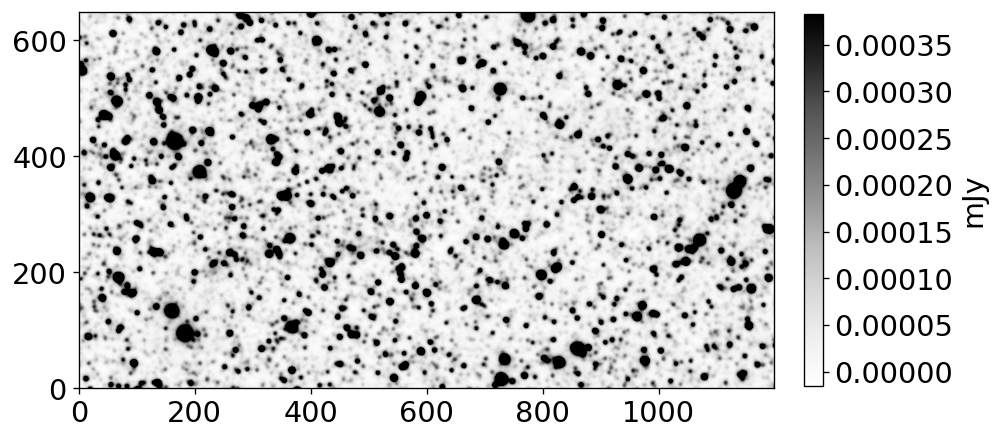

In [101]:
fig = plt.figure(figsize=(8,8),dpi=120)
ax = plt.subplot(111)#, projection=cutout.wcs)
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax.imshow(data_s2_flux_cor, origin='lower', cmap=cmap, norm=ImageNormalize(data_s2_flux_cor, ZScaleInterval()))
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.04, orientation="vertical", label='mJy')
plt.show()
plt.close()

In [102]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction. Fitted zp_s2='+str(zp_s2)


new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_s2_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/s2_30m_fm_reproj_ha_sysbkgcor_cutout_fluxed_to_r.fits', overwrite=True)

### Continuum subtraction

In [103]:
# The real background has values around -0.12 ct/s. We manually correct for it 
hdulist = fits.open(folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_r_flux_cor = gaussian_filter(hdulist[0].data, sigma=2.5)  * (10**(-0.4*(-zp_r + 48.6))/ np.mean(star_surface_area_s2))/1e-26

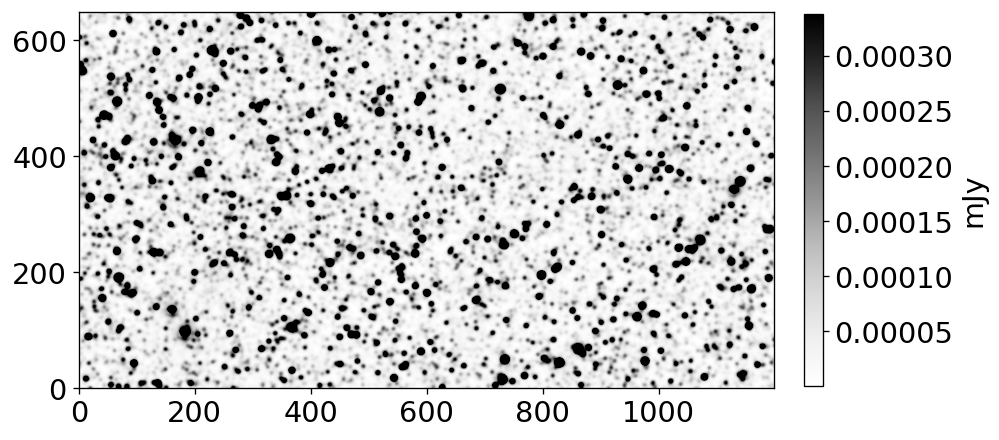

In [104]:
fig = plt.figure(figsize=(8,8),dpi=120)
ax = plt.subplot(111)#, projection=cutout.wcs)
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax.imshow(data_r_flux_cor, origin='lower', cmap=cmap, norm=ImageNormalize(data_r_flux_cor, ZScaleInterval()))
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.04, orientation="vertical", label='mJy')

plt.show()
plt.close()

In [105]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction of smoothed image. Fitted zp_r='+str(zp_r)
new_header['history'] = 'Image was smoothed by sigma=2.5 in order to match PSF os SII filter'

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_r_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/r_5m_fm_reproj_ha_sysbkgcor_cutout_fluxed_sm25.fits', overwrite=True)

## Continuum subtracted image SII

In [106]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'SII - r'

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_s2_flux_cor - data_r_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/diff_s2_fluxed.fits', overwrite=True)

<Figure size 432x288 with 0 Axes>

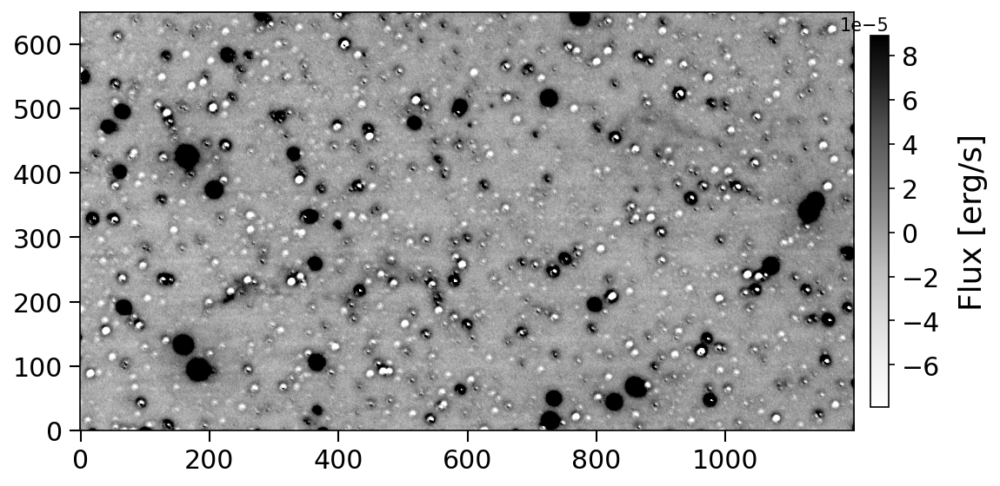

In [107]:
diff_s2 = data_s2_flux_cor - data_r_flux_cor
# diff_s2[diff_s2> 2e-5] = -1
plt.clf()
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
         }
fig = plt.figure(figsize=(8,5), dpi=150)
plt.subplots_adjust(wspace=0.)
plt.rcParams.update(params)

ax = plt.subplot((111)) 
ax.tick_params(axis='x', which='major', width=1.00, length=6, labelsize='x-large', top=False,
               bottom=True)
ax.tick_params(axis='y', which='major', width=1.00, length=6, labelsize='x-large', right=False,
               left=True)
im = ax.imshow(diff_s2, origin='lower',cmap='Greys', norm=ImageNormalize(data_s2_flux_cor - data_r_flux_cor  , ZScaleInterval()))

cbar = fig.colorbar(im, ax=ax, fraction=0.023, pad=0.02, orientation="vertical")
cbar.set_label(r'Flux [erg/s]', rotation=90, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

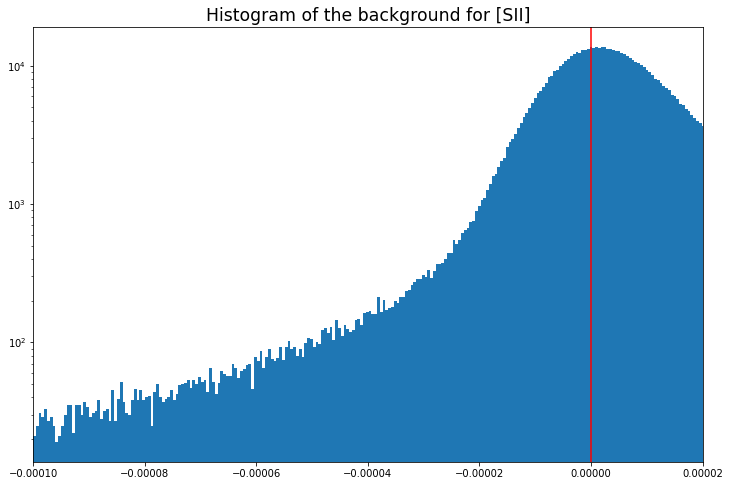

In [108]:
bins = np.linspace(-1e-4,1e-4,400)
plt.figure(figsize=(12,8))
h=plt.hist(diff_s2.flatten(),bins=bins)
plt.axvline(x=0,c='red')
# plt.xscale('log')
plt.xlim(-1e-4,2e-5)
plt.yscale('log')
plt.title('Histogram of the background for [SII]')
plt.plot

# OIII

In [109]:
# infile_o3 = folder + 'fluxed/o3_37m_fm_reproj_ha_cutout.fits.cat'
infile_o3 = folder + 'fm/o3_37m_fm_reproj_ha_sysbkgcor.fits.cat'
o3 = fits.getdata(infile_o3,2)
flags_o3 = o3['FLAGS'] == 0

# Opening the header to retrieve the WCS solution and applying to 
# the X_IMAGE and Y_IMAGE
# From Sextractor catalogue file
coo_o3 = fun_get_INT_coo(infile_o3, o3)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-END to 58720.902306 from DATE-END'. [astropy.wcs.wcs]


In [110]:
# We can perform a Nearest neighbour matching within the
# coordinate object
idx_pansatars_o3, d2d_panstars_o3, d3d_panstars_o3 = coo_o3[flags_o3].match_to_catalog_sky(coo_panstars)

In [111]:
# Performing a quality cut for the sky match.
# 1) Only select those stars with a distance of less than 1 arcsec
# 2) The catalogue gives by default a magnitude of 99 to all sources 
#    without one, we use 30 for no particular reason, 
# 3) Further cut is made to avoid under or over-exposed stars

ss_o3 = (d2d_panstars_o3.arcsec < 1) & (panstars.gMeanPSFMag[idx_pansatars_o3] <30.) & (~np.isnan(panstars.gMeanPSFMag[idx_pansatars_o3]))  & (panstars.gMeanPSFMag[idx_pansatars_o3] < 17) 
ee_o3 = ss_o3 & (panstars.gMeanPSFMag[idx_pansatars_o3] < 17) & (panstars.gMeanPSFMag[idx_pansatars_o3] > 13)

print("Number of detected sources: {:.0f}".format(ee_o3.sum()))

Number of detected sources: 240


In [112]:
# # Calculate temperature for used stars... .dropna(thresh=17) excludes stars with nan values
panstars['temp_K'] = panstars.loc[idx_pansatars_o3][ee_o3].dropna(thresh=17).apply(lambda row: fun_get_temp(row)[0], axis=1)
# panstars['temp_K_err'] = panstars.loc[idx_pansatars_o3][ee_o3].dropna(thresh=17).apply(lambda row: fun_get_temp(row)[1], axis=1)
panstars['a1'] = panstars.loc[idx_pansatars_o3][ee_o3].dropna(thresh=17).apply(lambda row: fun_get_temp(row)[2], axis=1)
panstars['redchi'] = panstars.loc[idx_pansatars_o3][ee_o3].dropna(thresh=17).apply(lambda row: fun_get_temp(row)[3], axis=1)

Text(0, 0.5, 'a1')

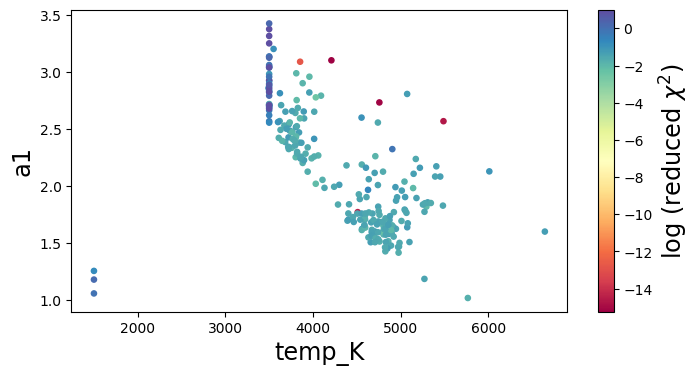

In [113]:
plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_o3][ee_o3]['temp_K'],panstars.loc[idx_pansatars_o3][ee_o3]['a1'], s=14, vmax=1, c=np.log10(panstars.loc[idx_pansatars_o3][ee_o3]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

Text(0, 0.5, 'a1')

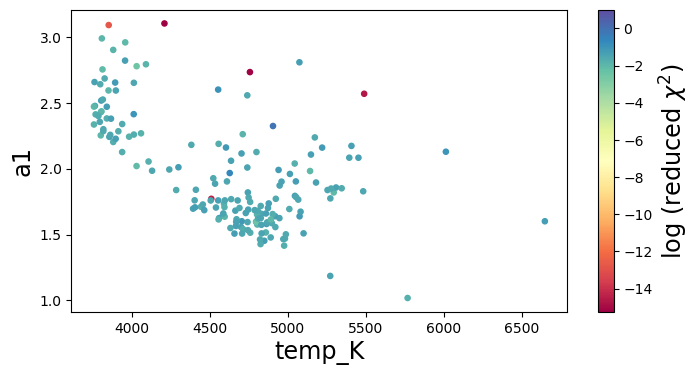

In [114]:
temp_cut_o3 = panstars.loc[idx_pansatars_o3][ee_o3]['temp_K'] > 3750

plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_o3][ee_o3]['temp_K'][temp_cut_o3],panstars.loc[idx_pansatars_o3][ee_o3][temp_cut_o3]['a1'], s=14, vmax=1, c=np.log10(panstars.loc[idx_pansatars_o3][ee_o3][temp_cut_o3]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

In [115]:
o3_calibrated = panstars.loc[idx_pansatars_o3][ee_o3][temp_cut_o3].apply(lambda row: fun_pogson_erg_to_mag_z(star_interp_INT(row['temp_K'])[4],row['a1'], 0,0), axis=1)


In [116]:
# Calculate magnitude including backgroud (otherwise background would be subtracted 2 times)
o3_mag, o3_mag_err = fun_calc_magnitude_z(o3, flags_o3, air_mass_o3, 0.19) # airmass and extinction correction

In [117]:
len(o3_mag[ee_o3][temp_cut_o3]), len(o3_mag_err[ee_o3][temp_cut_o3])

(172, 172)

In [118]:
args = (o3_calibrated[idx_pansatars_o3][ee_o3][temp_cut_o3], o3_mag[ee_o3][temp_cut_o3], o3_mag_err[ee_o3][temp_cut_o3])
zp_o3, out_o3, o3_clip_mask = fun_fit_zp(args)
out_o3

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:1143: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


In [119]:
zp_g - zp_o3

-2.5475589863141543

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:1143: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


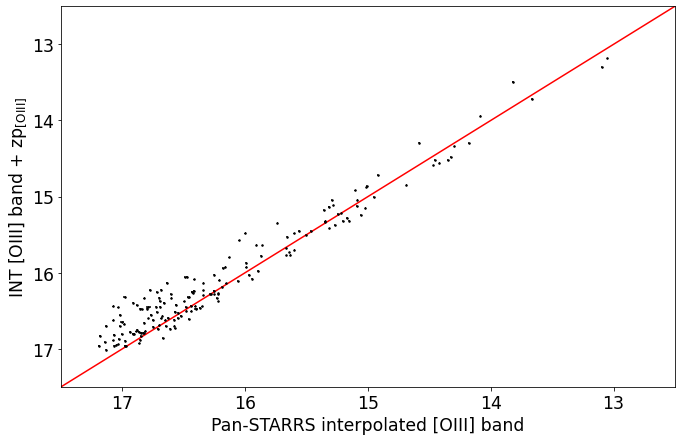

In [120]:
# Plotting observed vs expected panstars stars. This *may* 
# contain variable stars.
fig = plt.figure(figsize=(11,7))
plt.rcParams.update(params_color_plot)
plt.errorbar(o3_calibrated[idx_pansatars_o3][ee_o3][temp_cut_o3][o3_clip_mask],o3_mag[ee_o3][temp_cut_o3][o3_clip_mask]-zp_o3,
             yerr=o3_mag_err[ee_o3][temp_cut_o3][o3_clip_mask],
             xerr=panstars.gMeanPSFMagErr[idx_pansatars_o3][ee_o3][temp_cut_o3][o3_clip_mask],
             color='k',ls="None",marker="o",ms=1.5)
# plt.errorbar(o3_calibrated[idx_pansatars_o3][ee_o3][temp_cut_o3][~o3_clip_mask],o3_mag[ee_o3][temp_cut_o3][~o3_clip_mask]-zp_o3,
#              yerr=o3_mag_err[ee_o3][temp_cut_o3][~o3_clip_mask],
#              xerr=panstars.gMeanPSFMagErr[idx_pansatars_o3][ee_o3][temp_cut_o3][~o3_clip_mask],
#              color='green',ls="None",marker="o",ms=1.5)
xx = np.linspace(0,20,100)
plt.plot(xx,xx,'r')
plt.xlim(17.5,12.5)
plt.ylim(17.5,12.5)
plt.ylabel(r"INT [OIII] band + zp$_\mathrm{[OIII]}$")
plt.xlabel(r"Pan-STARRS interpolated [OIII] band")
# plt.savefig("test_r_stars.png")
plt.savefig(folder + '/figures/fig_g7_color_calib_o3.pdf', dpi=150, bbox_inches='tight')

In [121]:
star_surface_area_o3 = o3[flags_o3][ee_o3][temp_cut_o3]['FLUX_RADIUS']**2
print(np.mean(star_surface_area_o3), np.std(star_surface_area_o3))

14.756089 4.081907


### Continuum subtraction

In [122]:
hdulist = fits.open(folder + 'fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_o3_flux_cor = gaussian_filter(hdulist[0].data, sigma=1.39) * (10**(-0.4*(-zp_o3 + 48.6))/ np.mean(star_surface_area_g))/1e-26

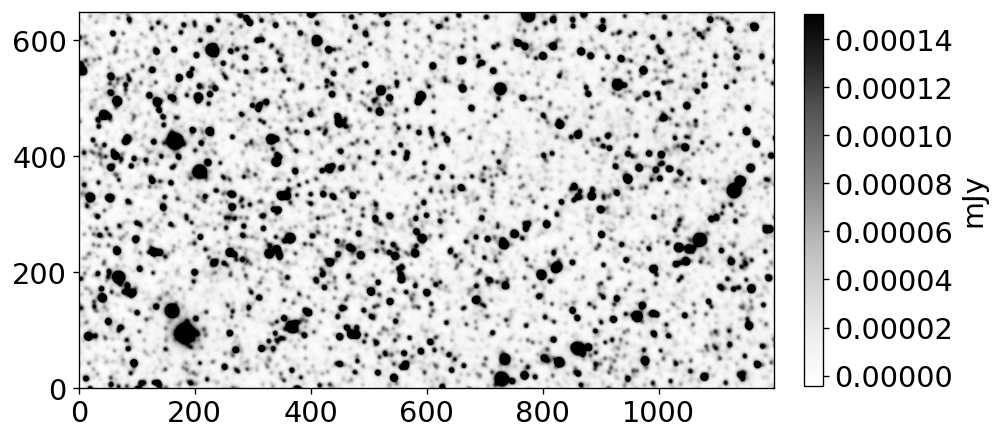

In [123]:
fig = plt.figure(figsize=(8,8),dpi=120)
ax = plt.subplot(111)#, projection=cutout.wcs)
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax.imshow(data_o3_flux_cor, origin='lower', cmap=cmap, norm=ImageNormalize(data_o3_flux_cor, ZScaleInterval()))
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.04, orientation="vertical", label='mJy')

plt.show()
plt.close()

In [124]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction. Fitted zp_o3='+str(zp_o3)
new_header['history'] = 'Zero point correction of smoothed image. Fitted zp_o3='+str(zp_o3)
new_header['history'] = 'Image was smoothed by sigma=1.39 in order to match PSF os g filter'

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_o3_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/o3_37m_fm_reproj_ha_sysbkgcor_cutout_fluxed_sm139.fits', overwrite=True)

In [125]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'OIII - g'

# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_o3_flux_cor - data_g_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/diff_o3_fluxed.fits', overwrite=True)

<Figure size 432x288 with 0 Axes>

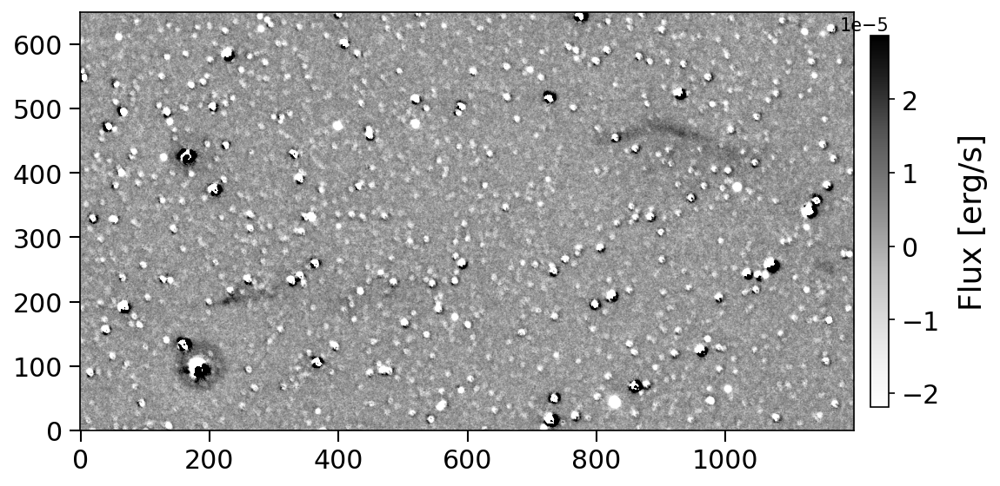

In [126]:
diff_o3 = data_o3_flux_cor - data_g_flux_cor
plt.clf()
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
         }
fig = plt.figure(figsize=(8,5), dpi=150)
plt.subplots_adjust(wspace=0.)
plt.rcParams.update(params)

ax = plt.subplot((111)) 
ax.tick_params(axis='x', which='major', width=1.00, length=6, labelsize='x-large', top=False,
               bottom=True)
ax.tick_params(axis='y', which='major', width=1.00, length=6, labelsize='x-large', right=False,
               left=True)
im = ax.imshow(diff_o3, origin='lower',cmap='Greys', norm=ImageNormalize(diff_o3 , ZScaleInterval()))

cbar = fig.colorbar(im, ax=ax, fraction=0.023, pad=0.02, orientation="vertical")
cbar.set_label(r'Flux [erg/s]', rotation=90, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

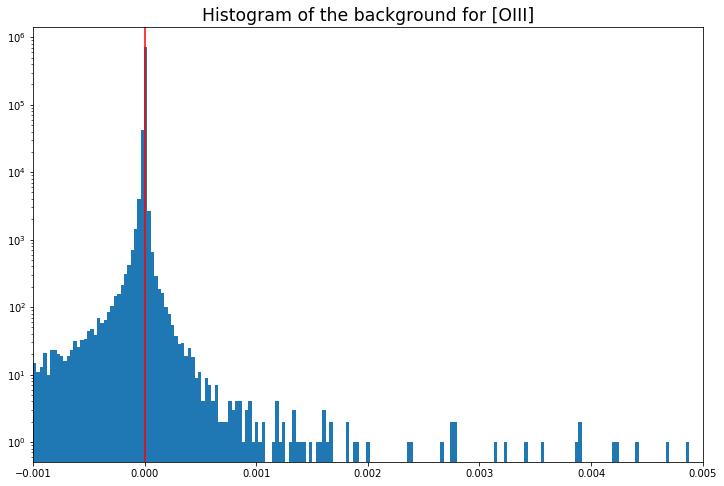

In [127]:
bins = np.linspace(-1e-3,5e-3,200)
plt.figure(figsize=(12,8))
h=plt.hist(diff_o3.flatten(),bins=bins)
plt.axvline(x=0,c='red')
# plt.xscale('log')
plt.xlim(-1e-3,5e-3)
plt.yscale('log')
plt.title('Histogram of the background for [OIII]')
plt.plot

# Hbeta

In [128]:
# infile_hb = folder + 'fluxed/hb_15m_fm_reproj_ha_cutout.fits.cat'
infile_hb = folder + 'fm/hb_15m_fm_reproj_ha_sysbkgcor.fits.cat'
hb = fits.getdata(infile_hb,2)
flags_hb = hb['FLAGS'] == 0

# Opening the header to retrieve the WCS solution and applying to 
# the X_IMAGE and Y_IMAGE
# From Sextractor catalogue file
coo_hb = fun_get_INT_coo(infile_hb, hb)

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
Set MJD-END to 58720.902306 from DATE-END'. [astropy.wcs.wcs]


In [129]:
# We can perform a Nearest neighbour matching within the
# coordinate object
idx_pansatars_hb, d2d_panstars_hb, d3d_panstars_hb = coo_hb[flags_hb].match_to_catalog_sky(coo_panstars)

In [130]:
# Performing a quality cut for the sky match.
# 1) Only select those stars with a distance of less than 1 arcsec
# 2) The catalogue gives by default a magnitude of 99 to all sources 
#    without one, we use 30 for no particular reason, 
# 3) Further cut is made to avoid under or over-exposed stars

ss_hb = (d2d_panstars_hb.arcsec < 1) & (panstars.gMeanPSFMag[idx_pansatars_hb] <30.) & (~np.isnan(panstars.gMeanPSFMag[idx_pansatars_hb]))  & (panstars.gMeanPSFMag[idx_pansatars_hb] < 17) 
ee_hb = ss_hb & (panstars.gMeanPSFMag[idx_pansatars_hb] < 17) & (panstars.gMeanPSFMag[idx_pansatars_hb] > 13)

print("Number of detected sources: {:.0f}".format(ee_hb.sum()))

Number of detected sources: 317


### Number of avaiable sources is cut down further as we use only stars with all filters avaiable for temperature fitting

In [131]:
# Calculate temperature for used stars
panstars['temp_K'] = panstars.loc[idx_pansatars_hb][ee_hb].dropna().apply(lambda row: fun_get_temp(row)[0], axis=1)
panstars['a1'] = panstars.loc[idx_pansatars_hb][ee_hb].dropna().apply(lambda row: fun_get_temp(row)[2], axis=1)

Text(0, 0.5, 'a1')

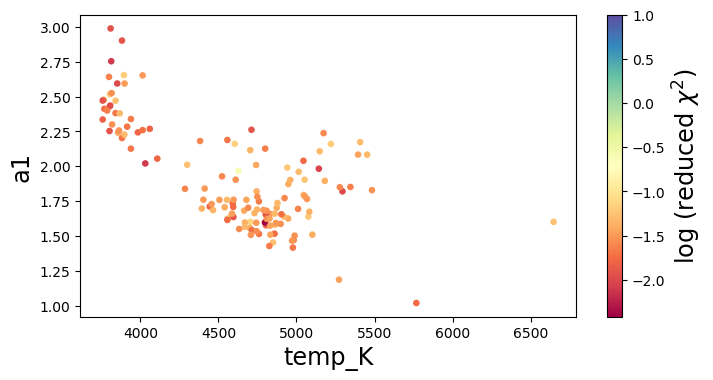

In [132]:
plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_hb][ee_hb]['temp_K'],panstars.loc[idx_pansatars_hb][ee_hb]['a1'], s=14, vmax=1, c=np.log10(panstars.loc[idx_pansatars_hb][ee_hb]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

In [133]:
temp_cut_hb = panstars.loc[idx_pansatars_hb][ee_hb]['temp_K'] > 3750

Text(0, 0.5, 'a1')

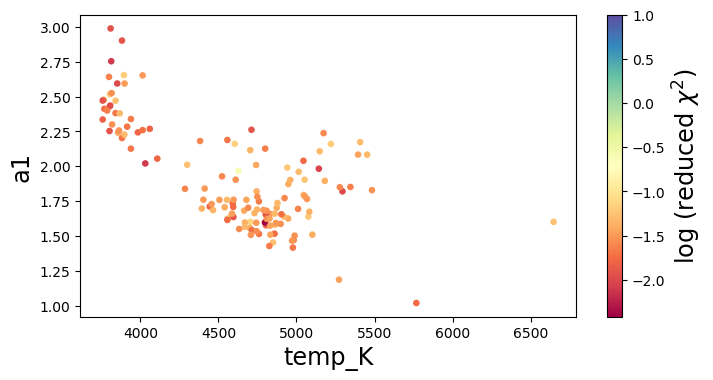

In [134]:
plt.figure(figsize=(8,4),dpi=100)
sc = plt.scatter(panstars.loc[idx_pansatars_hb][ee_hb][temp_cut_hb]['temp_K'],panstars.loc[idx_pansatars_hb][ee_hb][temp_cut_hb]['a1'], s=14, vmax=1, c=np.log10(panstars.loc[idx_pansatars_hb][ee_hb][temp_cut_hb]['redchi']), cmap='Spectral') #s=np.log10(df['redchi'])**3
plt.colorbar(sc,label=r'log (reduced $\chi ^2$)')
plt.xlabel('temp_K')
plt.ylabel('a1')

In [135]:
hb_calibrated = panstars.loc[idx_pansatars_hb][ee_hb][temp_cut_hb].apply(lambda row: fun_pogson_erg_to_mag_z(star_interp_INT(row['temp_K'])[4],row['a1'], 0,0), axis=1)


In [136]:
# Calculate magnitude including backgroud (otherwise background would be subtracted 2 times)
hb_mag, hb_mag_err = fun_calc_magnitude_z(hb, flags_hb, air_mass_hb ,0.19)

In [137]:
len(hb_mag[ee_hb][temp_cut_hb]), len(hb_mag_err[ee_hb][temp_cut_hb])

(137, 137)

In [138]:
args = (hb_calibrated[idx_pansatars_hb][ee_hb][temp_cut_hb], hb_mag[ee_hb][temp_cut_hb], hb_mag_err[ee_hb][temp_cut_hb])
zp_hb, out_hb, hb_clip_mask = fun_fit_zp(args)
out_hb

/home/vdomcek/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:1143: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


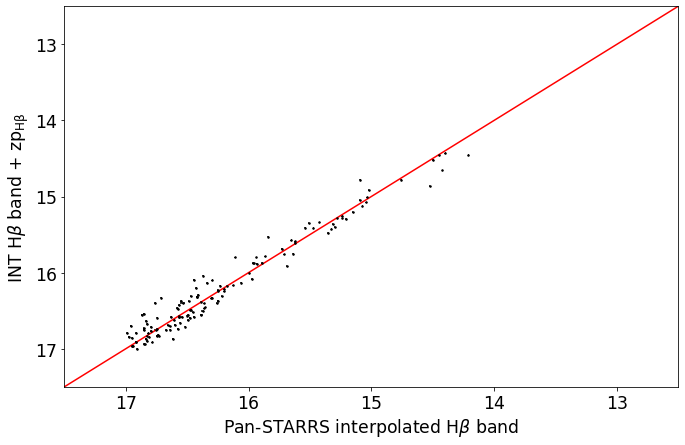

In [139]:
# Plotting observed vs expected panstars stars. This *may* 
# contain variable stars.
fig = plt.figure(figsize=(11,7))
plt.rcParams.update(params_color_plot)
plt.errorbar(panstars.gMeanPSFMag[idx_pansatars_hb][ee_hb][temp_cut_hb][hb_clip_mask],hb_mag[ee_hb][temp_cut_hb][hb_clip_mask]-zp_hb,
             yerr=hb_mag_err[ee_hb][temp_cut_hb][hb_clip_mask],
             xerr=panstars.gMeanPSFMagErr[idx_pansatars_hb][ee_hb][temp_cut_hb][hb_clip_mask],
             color='k',ls="None",marker="o",ms=1.5)
# plt.errorbar(panstars.gMeanPSFMag[idx_pansatars_hb][ee_hb][temp_cut_hb][~hb_clip_mask],hb_mag[ee_hb][temp_cut_hb][~hb_clip_mask]-zp_hb,
#              yerr=hb_mag_err[ee_hb][temp_cut_hb][~hb_clip_mask],
#              xerr=panstars.gMeanPSFMagErr[idx_pansatars_hb][ee_hb][temp_cut_hb][~hb_clip_mask],
#              color='green',ls="None",marker="o",ms=1.5)
xx = np.linspace(0,20,100)
plt.plot(xx,xx,'r')
plt.xlim(17.5,12.5)
plt.ylim(17.5,12.5)
plt.ylabel(r"INT H$\beta$ band + zp$_\mathrm{H\beta}$")
plt.xlabel(r"Pan-STARRS interpolated H$\beta$ band")
# plt.savefig("test_r_stars.png")
plt.savefig(folder + '/figures/fig_g7_color_calib_hb.pdf', dpi=150, bbox_inches='tight')

In [140]:
zp_g - zp_hb

-3.939561789795345

In [141]:
star_surface_area_hb = hb[flags_hb][ee_hb][temp_cut_hb]['FLUX_RADIUS']**2
print(np.mean(star_surface_area_hb), np.std(star_surface_area_hb))

14.687097 3.0284944


In [142]:
hdulist = fits.open(folder + 'fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_hb_flux_cor = (hdulist[0].data) * (10**(-0.4*(-zp_hb + 48.6))/ np.mean(star_surface_area_hb))/1e-26

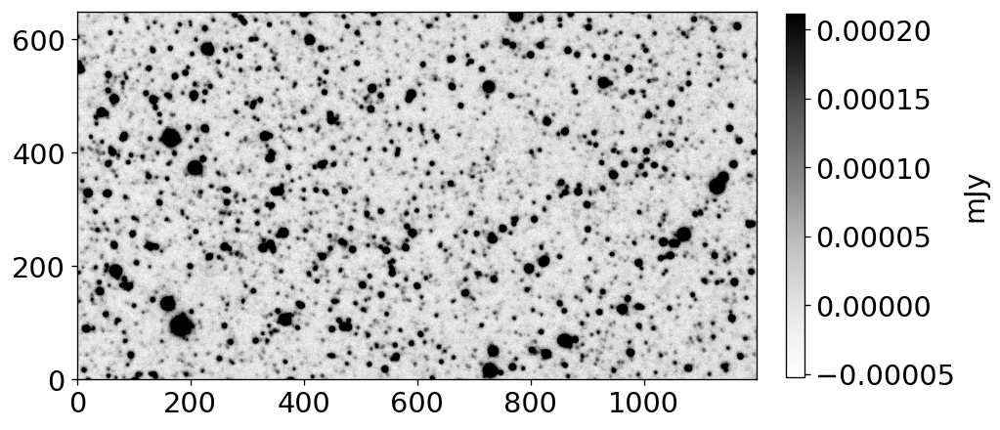

In [143]:
fig = plt.figure(figsize=(8,8),dpi=120)
ax = plt.subplot(111)#, projection=cutout.wcs)
cmap = cm.get_cmap('Greys')
cmap.set_bad(color='white')

im = ax.imshow(data_hb_flux_cor, origin='lower', cmap=cmap, norm=ImageNormalize(data_hb_flux_cor, ZScaleInterval()))
cbar = plt.colorbar(im, ax=ax, fraction=0.025, pad=0.04, orientation="vertical", label='mJy')

plt.show()
plt.close()

In [144]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction of image. Fitted zp_hb='+str(zp_hb)
# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_hb_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout_fluxed.fits', overwrite=True)

### Continuum subtraction

In [145]:
hdulist = fits.open(folder + 'fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout.fits')
data_hb_flux_cor_smooth = gaussian_filter(hdulist[0].data, sigma=1.37) * (10**(-0.4*(-zp_hb + 48.6))/ np.mean(star_surface_area_g))/1e-26

In [146]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Zero point correction of smoothed image. Fitted zp_hb='+str(zp_hb)
new_header['history'] = 'Image was smoothed by sigma=1.37 in order to match PSF of g filter'
# new_header

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_hb_flux_cor_smooth
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/hb_15m_fm_reproj_ha_sysbkgcor_cutout_fluxed_sm137.fits', overwrite=True)

In [147]:
new_header = hdulist[0].header
new_header['history'] = '--------------------------------------------------'
new_header['history'] = 'Used script:    int_fourstar.ipynb'
new_header['history'] = 'Author:         Vladimir Domcek'
new_header['history'] = 'Date and time:  ' + time.strftime('%X %x %Z')
new_header['history'] = 'Main changes: '
new_header['history'] = 'Hb - g'

new_file_hdu = fits.PrimaryHDU()
new_file_hdu.header = new_header
new_file_hdu.data = data_hb_flux_cor_smooth - data_g_flux_cor
new_file_hdu.verify('fix')
new_file_hdu.writeto(folder + 'fluxed/diff_hb_fluxed.fits', overwrite=True)

<Figure size 432x288 with 0 Axes>

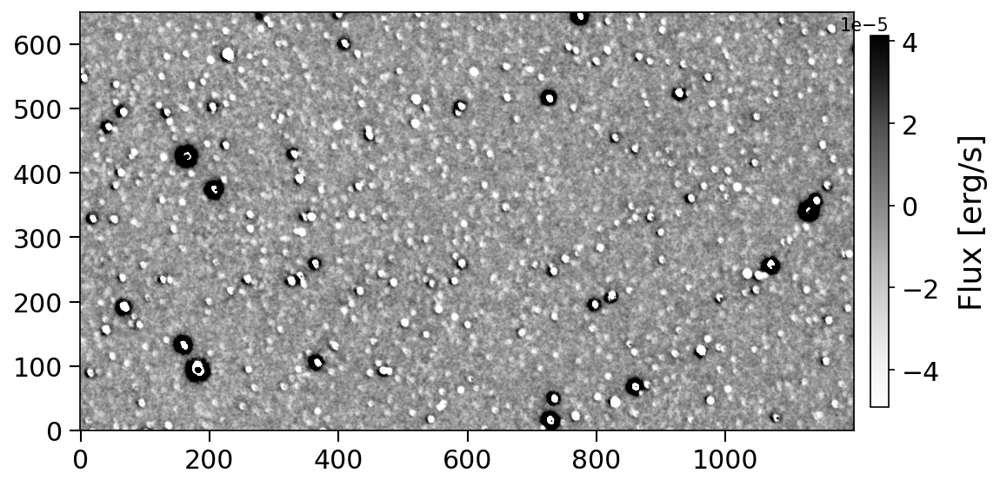

In [148]:
diff_hb = data_hb_flux_cor_smooth - data_g_flux_cor
plt.clf()
params = {'legend.fontsize': 'x-large',
          'axes.labelsize': 'xx-large',
          'axes.titlesize': 'xx-large',
          'xtick.labelsize': 'medium',
          'ytick.labelsize': 'medium',
         }
fig = plt.figure(figsize=(8,5), dpi=150)
plt.subplots_adjust(wspace=0.)
plt.rcParams.update(params)

ax = plt.subplot((111)) 
ax.tick_params(axis='x', which='major', width=1.00, length=6, labelsize='x-large', top=False,
               bottom=True)
ax.tick_params(axis='y', which='major', width=1.00, length=6, labelsize='x-large', right=False,
               left=True)
im = ax.imshow(diff_hb, origin='lower',cmap='Greys', norm=ImageNormalize(diff_hb , ZScaleInterval()))

cbar = fig.colorbar(im, ax=ax, fraction=0.023, pad=0.02, orientation="vertical")
cbar.set_label(r'Flux [erg/s]', rotation=90, labelpad=10)
cbar.ax.tick_params(labelsize='x-large')

<function matplotlib.pyplot.plot(*args, scalex=True, scaley=True, data=None, **kwargs)>

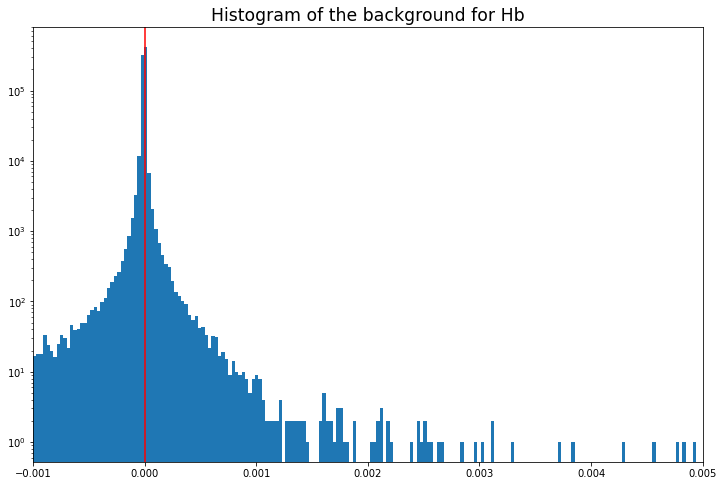

In [149]:
bins = np.linspace(-1e-3,5e-3,200)
plt.figure(figsize=(12,8))
h=plt.hist(diff_hb.flatten(),bins=bins)
plt.axvline(x=0,c='red')
# plt.xscale('log')
plt.xlim(-1e-3,5e-3)
plt.yscale('log')
plt.title('Histogram of the background for Hb')
plt.plot